# Learning to Search

**Learning** refers to the process of teaching algorithms to efficiently explore and navigate complex problem spaces to find solutions. Unlike traditional approaches where solutions are explicitly defined, learning-based search methods enable systems to adapt and improve their search strategies over time. This approach is particularly powerful in scenarios with vast or dynamic search spaces, such as optimization problems, or decision-making tasks. By leveraging techniques from **Machine Learning**, **Reinforcement Learning**, and **Deep Reinforcement Learning**, systems can learn to identify patterns, evaluate possible outcomes, and make informed decisions, ultimately enhancing their ability to solve problems autonomously and efficiently.

## Traditional Programming

In traditional software, **the programmer designs an algorithm that processes input, applies predefined rules, and generates output**. Every decision—such as determining game over, updating the score, or positioning the ball—is explicitly coded, with the program following rigid, hardcoded rules.

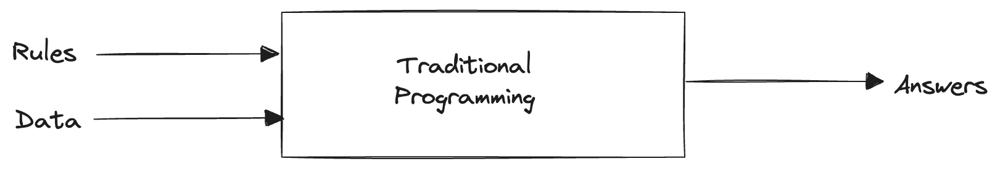

This approach is powerful but has limitations. As complexity grows, so does the code required, making it harder to manage. In many cases, **some scenarios are simply too complex or impractical to define and implement with traditional coding alone**. Consider **activity detection**, a task handled by smartwatches. The goal is to identify actions like walking, running, biking, or golfing using sensor data. Simple rules can distinguish walking from running based on speed, but more complex activities, like golfing, are harder to define with fixed thresholds. As activities become more nuanced, writing accurate rules becomes increasingly challenging:

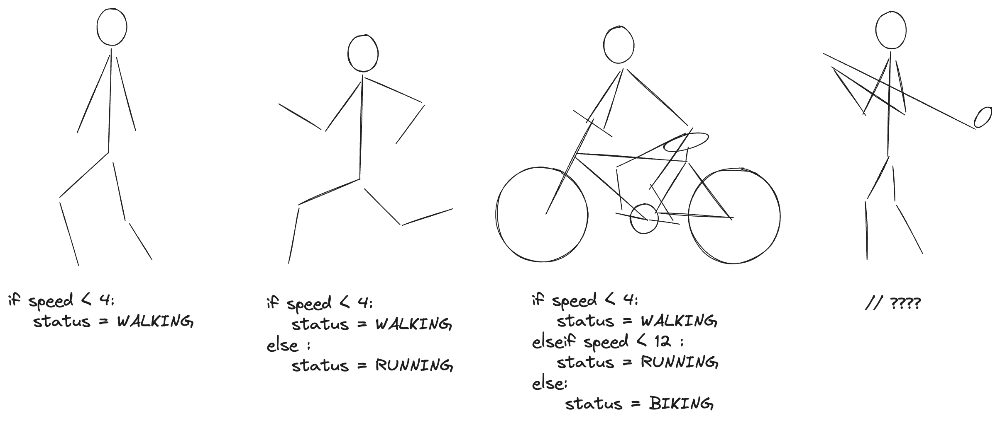

Rules can be overly simplistic and fail to capture the complexity of real-world scenarios. For example, a person running downhill might move faster than someone biking uphill, making speed alone unreliable. These **edge cases** highlight the **limitations of rule-based approaches**, which struggle to account for the nuances and variability of real-life activities.

## Learning

Instead of explicitly coding a solution, we enable the computer **to learn how to solve a problem**. Rather than manually defining rules, we provide the computer with data and corresponding answers, allowing it to **discover the rules** that connect them. This way, the computer **learns to generalize patterns**, eliminating the need to define every rule explicitly:

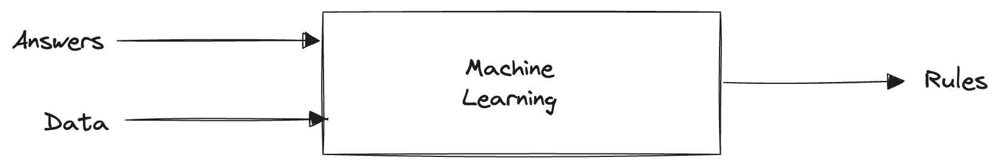

In the activity detection scenario, we can collect a large amount of labeled sensor data, indicating the activity the user is performing. By analyzing this data, the computer learns to identify patterns and relationships, automatically determining the rules that distinguish activities like walking, running, biking, or golfing. This removes the need for manually defining rules, as the computer uncovers them directly from the data:

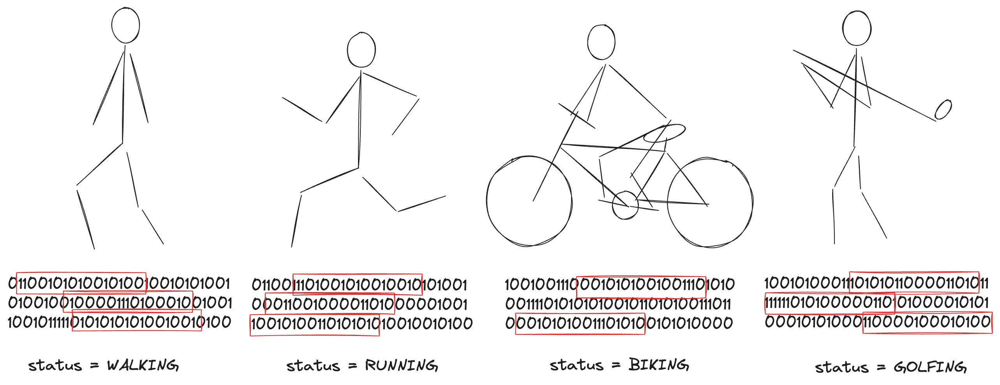

### Model

The computer starts by making **an initial guess** about the relationship between the data and labels. It then **evaluates the accuracy** of that guess by comparing it to the correct answer. Using this feedback, it **adjusts its approach** to improve the guess, building on previous learning. Through repeated iterations, **each guess improves upon the last**, enabling the computer **to learn from experience** and gradually converge on the best solution:

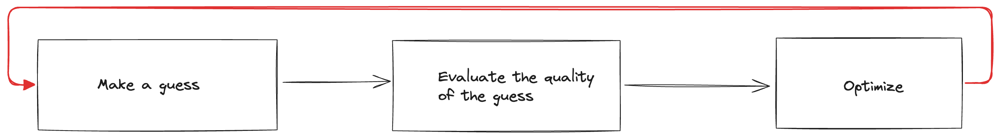

This process **builds a model** that can be used to **label new, unseen data**, a process called **inference**. A model is a **mathematical representation of the relationships between variables**:

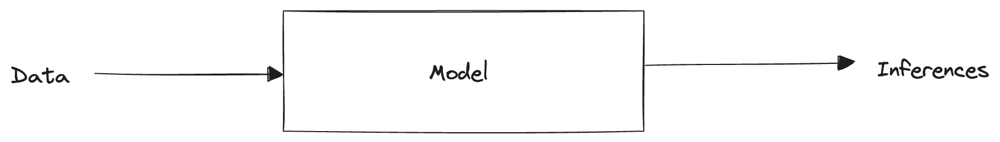

For example, a **business model** predicts future profit based on inputs like "number of users" and "ad revenue per user." A **cookbook recipe** connects inputs like "number of diners" and "level of hunger" to ingredient quantities. An **electronic circuit design** models output voltage based on inputs like supply voltage, resistance, and current. These models are built using different methods: business models often rely on **simple mathematical relationships**, recipes may be based on **trial and error**, and circuit models use **physical laws** like Ohm's and Kirchhoff's laws. **Each model provides a framework for making informed predictions based on relevant inputs.**

### Machine Learning

We’ll use the term **machine learning** to describe the process of creating and using models that are learned from data. The primary goal is to develop models that can predict outcomes for new, unseen data based on existing data. A widely recognized definition, provided by Tom Mitchell in [Machine Learning, 1998](http://www.cs.cmu.edu/~tom/mlbook.html):

> A computer program is said to learn from experience (E) with respect to some task (T) and some performance measure (P), if its performance on T, as measured  by P, improves with experience E.


For example, in a spam classification problem, the task (T) is to predict whether an email is spam or not. The experience (E) consists of labeled data, where emails are marked as spam or not spam. The performance measure (P) is the proportion of emails correctly classified by the model. As the program is exposed to more labeled data, its ability to classify emails improves, demonstrating learning from experience.

Creating a machine learning program involves **feeding data** (such as dashboard video and sensor readings from a car) along with **target outputs** (like throttle levels and steering angles) into **a specialized algorithm**. Through a process called **training**, the algorithm **learns from the data, discovers the underlying rules and builds a model** (a program capable of driving the car based on sensor inputs). This model can then process new data to make predictions, a process referred to as **inference**. This approach allows us to create systems that make predictions from complex data **without needing to fully understand all the complexities ourselves**. In essence, traditional programming involves automating tasks by writing explicit programs. In machine learning, the computer generates a program by learning patterns from the data.

### Types of Machine Learning

Machine learning approaches can be categorized as **supervised** (where the model learns from labeled data with correct answers), **unsupervised** (where there are no labels and the model finds patterns in the data), **semisupervised** (where only some of the data are labeled), and **reinforcement** (where the model makes predictions and receives feedback on its performance, improving over time):

| **Question**         	| **Supervised**               	| **Unsupervised**                	| **Reinforcement**                  	|
|----------------------	|------------------------------	|---------------------------------	|------------------------------------	|
| _Target_             	| f(x)=y                       	| x in X                          	| p(s)=a                             	|
| _Target (rephrased)_ 	| Predict outputs given inputs 	| Discover structure in data      	| Find an optimal behavior           	|
| _Data_               	| {(x,y)} supervisor's labels  	| {x} unlabelled data             	| {(s,a,r,s)} experience samples     	|
| _Output_             	| Classifier or regressor      	| Clusters or dimension reduction 	| Policies, value functions          	|
| _Key algorithms_     	| Neural networks, SVMs, etc.  	| k-means, PCA, etc.              	| Q-learning, Policy Gradients, etc. 	|

From the perspective of building agents, we are primarily interested in **reinforcement learning**, as it focuses on learning through interaction and feedback, however Machine Learning is important becouse it provide a way to implement the reinforcement learning algorithms in a scalable way.

## Reinforcement Learning

Reinforcement Learning is **a computational approach to learning through interaction**, where an agent learns to map situations to actions in order to maximize a numerical reward. The agent isn't told which actions to take but discovers the best actions by interacting with its **environment** (everything outside the agent) that it doesn't fully control. For example, when training a robot to pick up objects, the objects, tray, and external factors like wind are part of the environment. Even the robot arm is considered part of the environment, as it is subject to noise despite being controlled by the agent. This **boundary between agent and environment** is crucial: the agent's role is solely decision-making, while everything else is considered the environment:

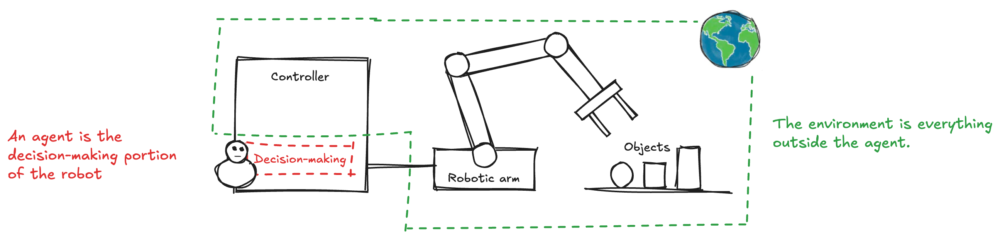

In challenging cases, actions can influence not only immediate rewards but also future situations and rewards. The key features of reinforcement learning are **trial-and-error search** and **delayed rewards**.

### Environment

The environment is represented by a **set of variables** relevant to the problem. In the robotic arm example, variables like the arm's location and velocity make up the environment. These variables and their possible values form the **state space**, with a **state** representing a specific instantiation of these values. Agents often don’t have access to the full state of the environment. Instead, they observe a subset of it, called an **observation**. For instance, the agent might only see camera images rather than the exact location of each object. Observations are derived from the state, and in literature, the terms state and observation are sometimes used interchangeably:

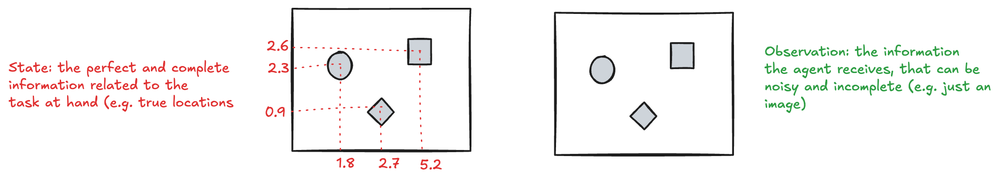

### Actions

At each state, the environment offers a **set of actions** for the agent to choose from. The agent influences the environment through these actions, which may lead to a change in state. The **transition function** governs this mapping. Additionally, the environment provides a **reward signal** based on the agent's action, governed by the **reward function**. Together, the transition and reward functions make up the **model** of the environment.

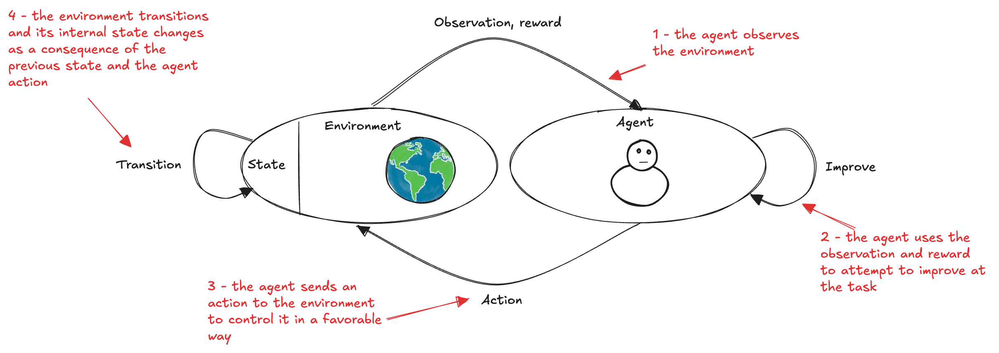

### Frozen Lake

Frozen Lake (FL) is a classic **grid-world environment** used in RL research. It features discrete state and action spaces, with four possible moves: left, down, right, and up. The goal is to navigate from a start location to a goal while avoiding holes:

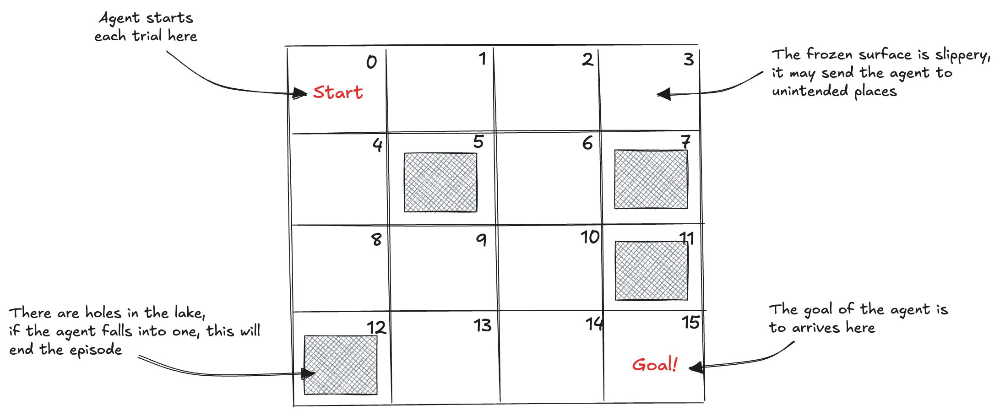

The challenge lies in the **slippery surface** (the environment is stochastic), the agent moves as intended only 33.3% of the time, while the remaining two-thirds are split evenly between orthogonal directions. For instance, if the agent moves down, there's a 33.3% chance it moves left or right instead:

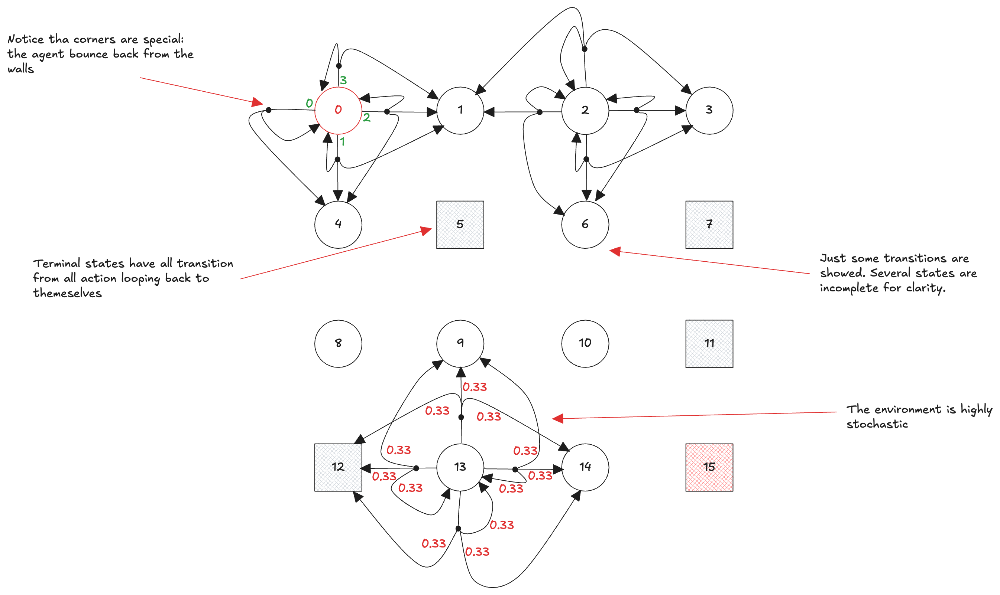

### Policy

It may seem that the agent's goal is to find a sequence of actions, or a **plan**, that maximizes the return (sum of rewards) from the initial state to the target state (at least for an episodic task). If Frozen Lake were deterministic, a solution would be easy: [Right, Right, Down, Down, Down, Right]. Unfortunately, the environment won’t always go along with this solution, because the **actions are unreliable**. The plan do not account for the **inherent stochasticity in environments**, and actions may not always have the desired effect. What happens if the agent reaches a state not covered by the plan?

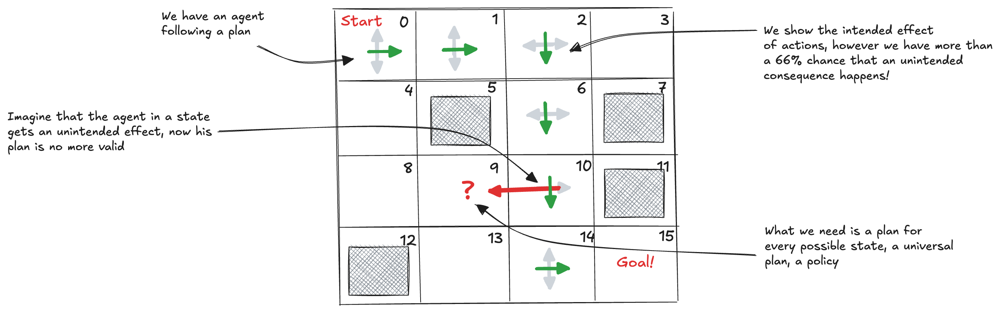

No fixed action sequence can solve the problem, therefore, a solution must specify **what the agent should do for any state** that the agent might reach. A solution of this kind is called a **policy**. It is traditional to denote a policy by $\pi$. No matter what the outcome of the action, the resulting state will be in the policy, and the agent will know what to do next. A **policy** is like a **universal plan** that covers all possible states. It can be **deterministic** (returns a single actions for a given state) or **stochastic** (returns an action-probability distribution):

$\pi(a|s) = P(A_t=a | S_t=s)$

The problem in Reinforcement Learning is to find a policy that can provide a good solution for the problem. A key question is: **how good is a policy?** How does it compare to another? To answer this, we need to consider the **expected return**, which accounts for the **stochastic nature of the environment**. Even with optimal actions, the environment may lead the agent in unintended directions. Consider the following policies for the frozen-lake environment:

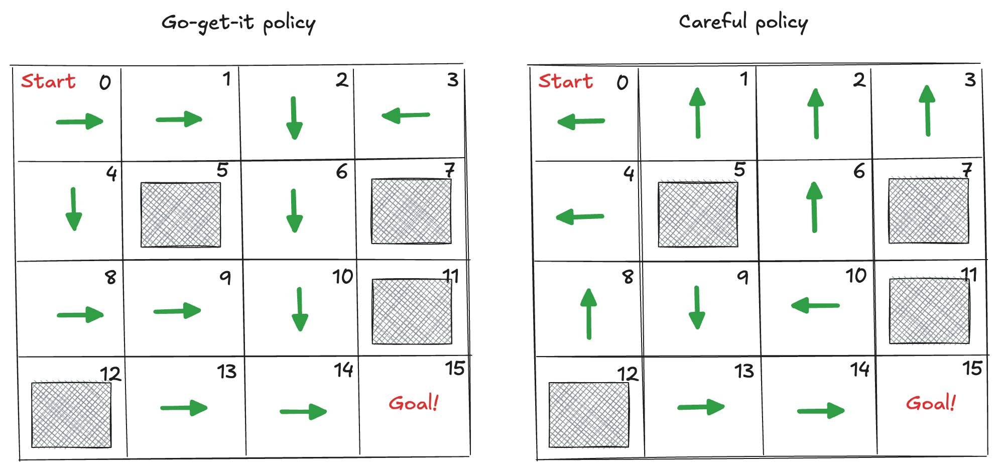

We can implement the two policies in Python:

In [649]:
LEFT, DOWN, RIGHT, UP = range(4)

def go_get_pi(s):
    policy = {
        0: RIGHT, 1: RIGHT, 2: DOWN, 3: LEFT,
        4: DOWN, 5: LEFT, 6: DOWN, 7: LEFT,
        8: RIGHT, 9: RIGHT, 10: DOWN, 11: LEFT,
        12: LEFT, 13: RIGHT, 14: RIGHT, 15: LEFT
    }
    return policy[s]

def careful_pi(s):
    policy = {
        0: LEFT, 1: UP, 2: UP, 3: UP,
        4: LEFT, 5: LEFT, 6: UP, 7: LEFT,
        8: UP, 9: DOWN, 10: LEFT, 11: LEFT,
        12: LEFT, 13: RIGHT, 14: RIGHT, 15: LEFT
    }
    return policy[s]

 A convinient Python library, called [**Gymnasium**](https://gymnasium.farama.org/), provides a huge number of standard environment with shared interfaces for writing general code and testing it. In particular, it provides a unified "Env" class that wraps environments and exposes essential methods like step() and reset(). This abstraction ensures our code remains environment-agnostic:

In [650]:
import gymnasium as gym

# Load the FrozenLake environment
frozen_lake = gym.make('FrozenLake-v1')

We can write a function to show the policy in action:

In [651]:
def show_policy(name, policy, env):
    # Get the grid size from the environment
    grid_size = env.unwrapped.desc.shape[0]  

    # Define the symbols for each action
    action_symbol = {LEFT: "⇦", DOWN: "⇩", RIGHT: "⇨", UP: "⇧"}
    
    # Print the policy name
    print("Policy: ", name)

    # Extract the map to exclude no walcable states
    map = env.unwrapped.desc

    # Loop over each cell in the grid
    for row in range(grid_size):
        for col in range(grid_size):

            # Show non walkable states
            if map[row, col] in [b'H']:
                print("■", end="  ")
                continue      
    
            # Convert the row and col into a state
            state = row * grid_size + col

            # Get the action for this state
            action = policy(state)

            # Print the symbol for the action
            print(action_symbol[action], end="  ")
        
        # Move to the next row
        print() 
    print() 

For example, we can check the two policies in the Frozen Lake environment:

In [652]:
show_policy("Go-get-it", go_get_pi, frozen_lake)
show_policy("Careful", careful_pi, frozen_lake)

Policy:  Go-get-it
⇨  ⇨  ⇩  ⇦  
⇩  ■  ⇩  ■  
⇨  ⇨  ⇩  ■  
■  ⇨  ⇨  ⇦  

Policy:  Careful
⇦  ⇧  ⇧  ⇧  
⇦  ■  ⇧  ■  
⇧  ⇩  ⇦  ■  
■  ⇨  ⇨  ⇦  



To compare the two policies, we can use a **brute-force approach**: we simulate the interaction between the environment and the agent for an extended period evaluating the probability of success.

In [653]:
import numpy as np

def evaluate(env, pi, n_episodes=10000):

    # Count the number of times the agent reaches the goal
    success = 0

    # Run the episodes
    for _ in range(n_episodes):

        # A flag to indicate whether the episode is done
        done = False    

        # Reset the environment and get the initial state
        state, _ = env.reset()

        # Run the episode
        while not done:
            
            # Make a step in the environment and collect the experience
            new_state, _, terminated, truncated, _ = env.step(pi(state))

            # Check if the episode is done
            if(terminated or truncated):
                done = True;
            
            # Go in the  new state
            state = new_state

        # Check if the agent reached the goal    
        if(state == 15):
            success += 1
            
    # Return the success rate
    return (success/n_episodes)*100

Since the environment is stochastic, an episode might never end. To prevent this, Gymnasium enforces a truncation condition (typically a time limit) to terminate episodes prematurely. Now, we can compare the two policies:

In [654]:
# Evaluate the go_get_pi policy
probability_success = evaluate(frozen_lake, go_get_pi);
print(f"Go-get-it reaches goal {probability_success:.2f}%")

# Evaluate the careful_pi policy
probability_success = evaluate(frozen_lake, careful_pi);
print(f"Careful reaches goal {probability_success:.2f}%")

Go-get-it reaches goal 3.95%
Careful reaches goal 55.03%


Surprisingly, the Go-Get-It policy doesn’t perform well in the Frozen Lake environment!

### Markov Decision Process

The way the environment changes as a response to actions is referred to as  the **transition function**, it maps a transition tuple to a probability:

$(s, a, s') \rightarrow p$ 

Given a state, an action, and a next state, it returns the corresponding probability of transition from that state to the next state when taking that action.

$\displaystyle p(s'| s,a) = P\left(S_t=s'|S_{t-1}=s, A_{t-1}=a\right)$

Notice that the transition function describes a probability distribution determining how the system will evolve in an interaction cycle from selecting actions in states. When integrating over the next states, as any probability distribution, the sum of these probabilities must equal one.

$\displaystyle \sum\limits_{s'\in S}{p(s'|s,a)=1\qquad \text{for all } s \in S, a \in A}$

One key assumption of many problems is that this distribution is **stationary**. That is, while there may be highly stochastic transitions, the probability distribution may not change during training or evaluation. In the Frozen Lake environment, the stationarity assumpimption means that the probability describing the effects of an action in a state is stochastic (33.3% for the intended direction, and the remaining 66.6% split evenly between the orthogonal directions) but remains constant over time. In real situation, the environment may change over time (e.g. the lake surface can be less slippery in sunny days). The **stationary assumption** can be often relaxed to some extent, however, it’s important that environments at least appear to be stationary for long periods of time.

We assume that the probability of the next state, given the current state and action, is **independent of the history of interactions**. This memory-less property is known as the **Markov property**. The probability of moving from one state to another state on two separate occasions, given the same action, is the same regardless of all previous states or actions encountered before that point:

$\displaystyle P(S_{t+1}|S_t,A_t)=P(S_{t+1}|S_t,A_t,S_{t-1},A_{t-1},...)$

Il the problem holds this property, we say that the problem is a **Markov Decision Process** (MDP). Most agents are designed to take advantage of the Markov assumption, since it simplifies the learning process because the agent doesn't need to remember the entire history of interactions to make decisions. 

In practice, completely keeping the Markov assumption is impractical, perhaps impossible, and we must make sure we **feed our agent the necessary variables to make it hold as tightly as possible**. The more variables we add, the longer it takes to train an agent, but the fewer variables, the higher the chance the information fed to the agent is not sufficient, and the harder it is to learn anything useful.

To fully define the problem, we must specify the information the agent can exploit to assess the quality of its choices. The **reward function** maps a transition tuple to a numeric signal of the goodness of that transitions:

$(s, a, s') \rightarrow R$ 

A key feature of reinforcement learning is **using a reward signal to define goals**. To guide the agent toward our objectives, we provide rewards that incentivize actions leading to those goals. **It is essential that these rewards clearly reflect the desired outcomes**. Formally, we can define the reward function as the expected value of reward given the state-action-state tuple:
 
$\displaystyle r(s,a,s') = E\left[R_t|S_{t-1}=s, A_{t-1}=a, S_t=s'\right]$

For Frozen Lake problem, the reward is 0 for all transitions except those entering terminal states, which have rewards +1.

Although goal-setting through rewards may seem limiting, it is highly flexible and effective. Notice that the reward signal should communicates **what** we want the agent to achieve, not **how** to achieve it. Positive rewards can be seen as **incentives or benefits**, while negative rewards serve as **costs, penalties, or punishments**. However, in real situaion, we don't have access to the **dynamics of the environment** (the transition function and the reward function are unknown), and the agent must act to **learn** somethin through **trial and error** by interacting with the environment. Reinforcement Learning is not "just solving an MDP", because the agent is not given the MDP as a problem to solve, the agent **is in the MDP**. Imagine playing a new game whose rules we don’t know, after a hundred or so moves, the referee tells us “You lose.” That is reinforcement learning in a nutshell.

### Experience

The agent follows a three-step process: it interacts with the environment, evaluates its behavior based on the reward feedback, and improves its responses. These interactions occur over multiple **time steps**:

$\displaystyle t=0,1,2,3,...$. 

At each time step, the agent receives some representation of environment state from the state space, and on that basis selects an action from the set of possible actions. One time step later, in part as a consequence of its action, the agent receives a numerical reward and finds itself in a new state. The environment and the agent together give rise to a **trajectory** like this:

$\displaystyle S_0\overset{A_0}{\rightarrow}R_1,S_1\overset{A_1}{\rightarrow}R_2,S_2\overset{A_2}{\rightarrow}R_3,S_3\overset{A_3}{\rightarrow}...R_i,S_i\overset{A_i}{\rightarrow}...$

The combination of state, action, reward, and new state is called an **experience**. Tasks with a natural ending, like a game, are **episodic tasks**, while those without, like learning forward motion, are **continuing tasks**. The sequence of time steps in an episodic task is called an **episode**, and agents may need several time steps and episodes to solve a task:

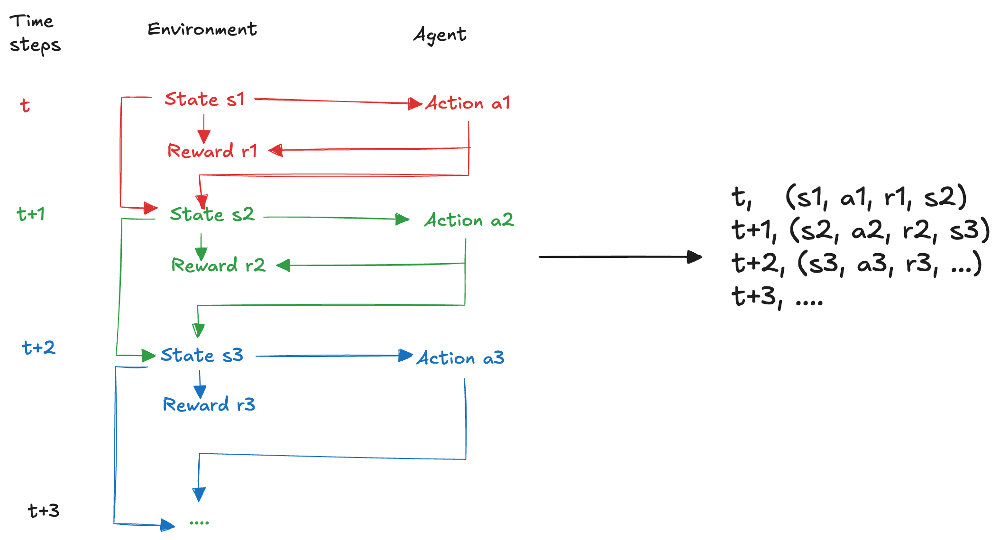

To begin the interaction, we draw a state from a set of the possible **starting states** based on a probability distribution. A **terminal state** is as state in wich all actions lead to it, and these transitions yield no reward.

## Challenges

Balancing immediate and long-term goals is challenging. We experience this point every day: should I watch movies tonight or keep studying reinforcement learning? The first choice has an **immediate satisfaction**, the second on the other hand, won’t really give us much tonight, but **maybe (and only maybe)** will provide much **higher satisfaction in the long term**. We can consider the most important challenges we need to consider in designing an agent in this context.

### Delayed consequences

The agent's actions may have **delayed consequences**, with rewards often being sparse and appearing only after several time steps. This requires the agent to learn from sequential feedback, leading to the **temporal credit assignment problem**: how can the agent determine which state and action were responsible for a given reward?

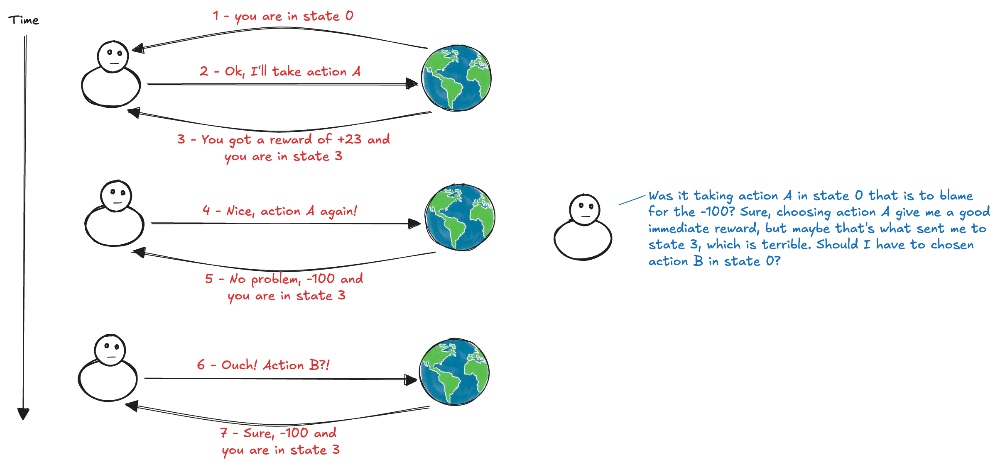

### Exploration and Exploitation

The reward the agent receives is **weak**, as it does not provide direct supervision. It signals **goodness**, but not **correctness**, and offers no information about other possible rewards. Therefore, the agent must learn from **evaluative feedback**, necessitating **exploration**. The agent must balance gathering new information with exploiting what it already knows, which is known as the **exploration versus exploitation trade-off**. This is the same problem faced during the considered in the **multi-armed bandit problem**, which can be considered a simplified version of reinforcement learning with only one state.

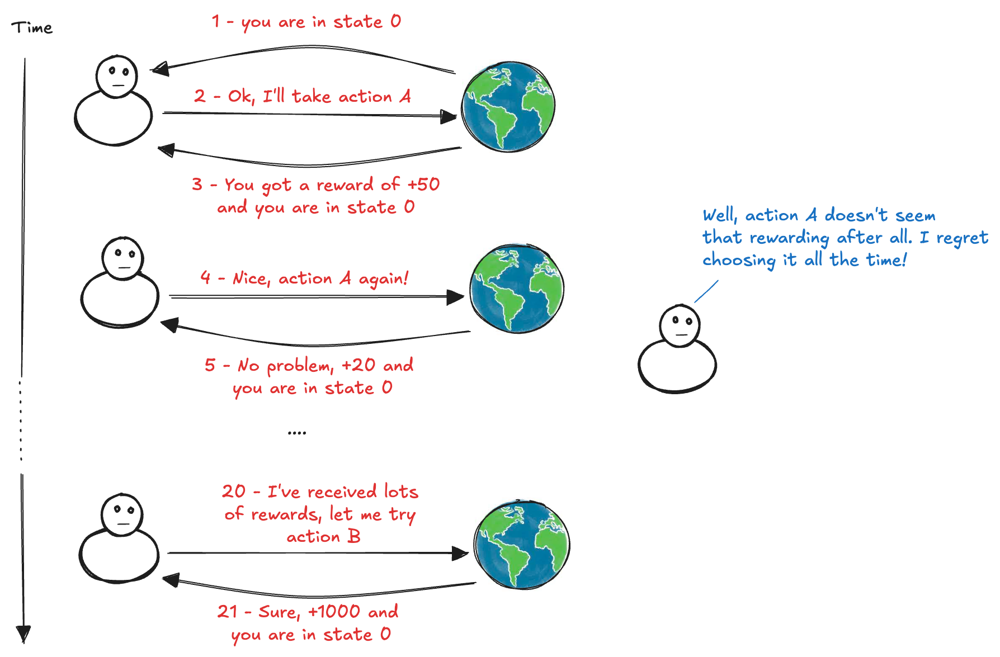

### Sampled feedback

Finally, the reward received by the agent is just a **sample**, and the agent doesn’t have access to the reward function. Also, the state and action spaces are commonly large, even infinite, so trying to learn from **sparse and weak feedback** becomes a harder challenge with samples. Therefore, the agent must be able to learn from sampled feedback, and it must be able to generalize.

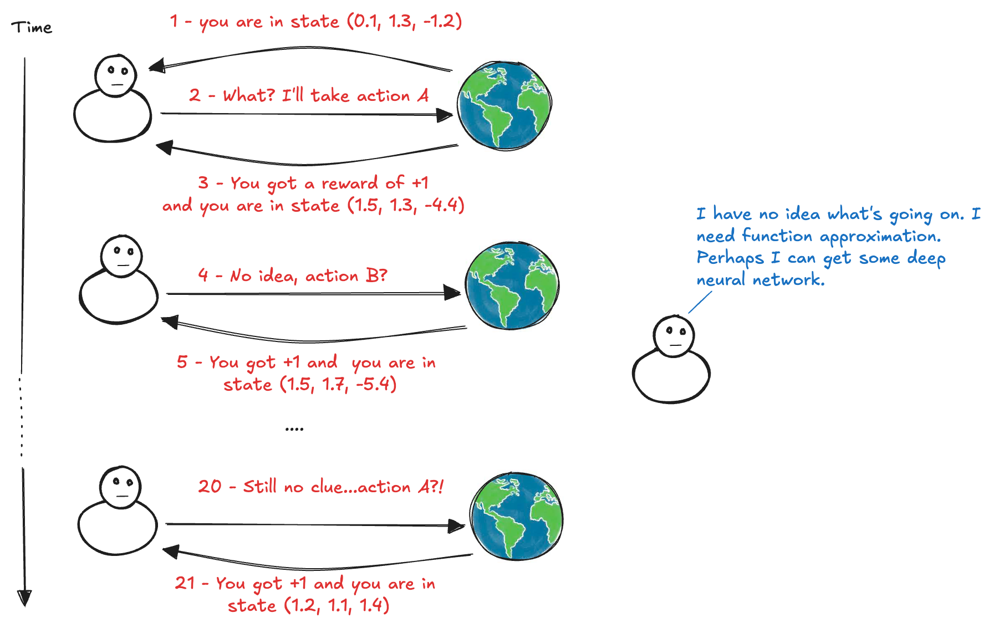

## Learning by trial and error

The MDP framework is **abstract and flexible**, making it applicable to a wide range of problems. Actions can be **low-level**, such as motor voltages in a robot, or **high-level**, like deciding whether to attend graduate school. Similarly, states can range from **raw sensor readings** to **symbolic representations**. In essence, actions represent decisions to learn, and states encompass any relevant information for decision-making. Several extensions adapt MDPs to different RL scenarios, such as the **Partially Observable MDP (POMDP)**, which handles cases where the agent has limited state information, the **Continuous MDP**, which accommodates continuous time, actions, or states, and the **Multi-Agent MDP**, which allows multiple agents to interact within the same environment.

How can we find a good policy for the agent?

### The Return

The agent's goal is to **maximize the total reward** it receives, focusing not only on immediate rewards but also on **cumulative rewards** over time. The total reward accumulated throughout an episode is known as **the return**:

$\displaystyle  G_t = R_{t+1} + R_{t+2} + R_{t+3} + ... + R_T = \sum\limits_{k=0}^{T}{R_{t+k+1}}$

In episodic tasks, the agent–environment interaction occurs in finite sequences (e.g., playing a game or navigating a maze), with each episode ending in a terminal state and restarting. In continuing tasks, the interaction is ongoing, leading to an infinite summation of rewards (a problem known as **unboundedness**). To handle this, we **discount future rewards**, making rewards received sooner more valuable than those in the future. This is done using a **discount factor**, a positive value less than one, that exponentially reduces the value of future rewards.
 
$\displaystyle G_t = R_{t+1} + \gamma R_{t+2} + \gamma^2 R_{t+3} + ... + \gamma^{T-1} R_T = \sum\limits_{k=0}^{T}{\gamma^k R_{t+k+1}}$

Discounted rewards are useful for several reasons beyond eliminating problematic infinities. Empirically, both humans and animals **prioritize near-term rewards over distant ones**. Economically, if rewards are monetary, **early rewards can be invested**, generating returns while awaiting future rewards, making the discount factor analogous to an interest rate. Additionally, **uncertainty in rewards** plays a role, future rewards may never materialize due to factors outside the transition model. Under certain conditions, the discount factor can represent the probability of unexpected termination at each time step. More generally, it **reduces variance in return estimates**, as looking too far ahead increases uncertainty. By discounting future rewards, learning stabilizes, and value function estimates become more reliable.

We can rewrite the return in a recursive way, which show that the returns at successive time steps are related to each other:

$\displaystyle  G_t = R_{t+1} + \gamma (R_{t+2}+\gamma R_{t+3} + \gamma^2 R_{t+4}+...) = R_{t+1}+\gamma G_{t+1}$

Notice that we are under stochastic environments, so each time a policy is executed starting from the initial state, the stochastic nature of the environment may lead to a different trajectory.

### Value functions

Having decided that the utility of a given episode is the sum of discounted rewards, we can compare policies by comparing the expected utilities obtained when executing them, which is known as the **state-value function (V-function)**:

$\displaystyle V_{\pi}(s)=E_{\pi}\left[G_t|S_t=s\right] $

This value isn’t straightforward to calculate, because of the dependence on the values of other states. For example, if we follow the Go-get-it policy starting from state 14, we get the following value:

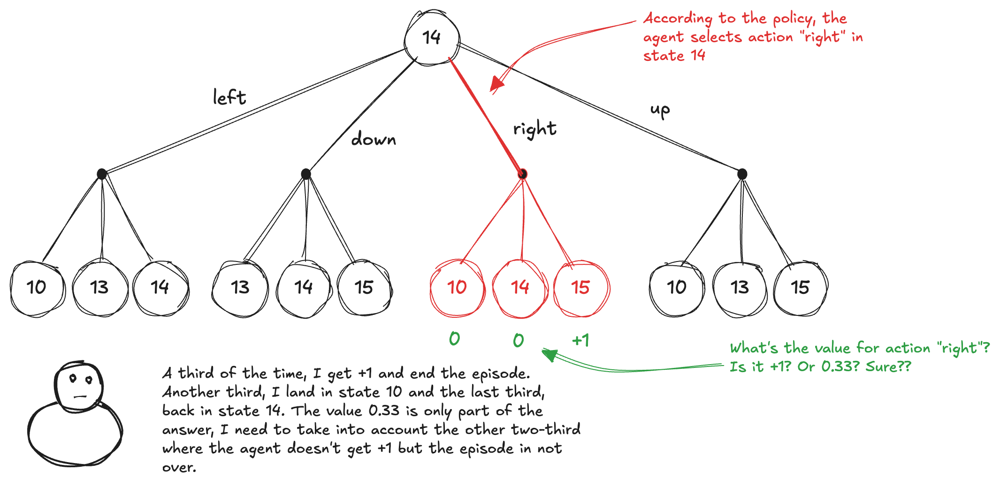

The critical question is not merely about the value of a state, but the value of taking an action in a state. The **action-value function (Q-function)** captures precisely this, the expected return if the agent follows a policy after taking an action in a state:

$\displaystyle Q_{\pi}(s,a)=E_{\pi}(G_t|S_t=s, A_t=a)$

### Optimal Policies

The state-value function allows us to compare policies. Suppose the agent is in state, among all possible policies, some will yield the highest expected utility. We denote these as **optimal policies**, marked with *:

$\displaystyle \pi^*(s) = \text{argmax}_\pi V^\pi(s)$

We can observe that the optimal policy is independent of the starting state. If two optimal policies from different starting states lead to the same third state, they should agree on the next action. Therefore, we can define the **true value** of a state as the expected sum of discounted rewards when following an optimal policy:

$\dispalaystyle V(s) = V^\Pi(s)

Considering the dynamics of the environment (the transition function and the reward function) and explicitly extracting the next action we can write the value function in a recursive way:

$\displaystyle V(s) = \text{argmax}_a \sum\limits_{s'}{p(s'|s,a)\left[r(s,a,s')+\gamma V(s')\right]}$

This is called the **Bellman equation**: the value of a state is the expected reward for the next transition plus the discounted utility of the next state, assuming that the agent chooses the optimal action. The Q-function is related to state value in the obvious way:

$\displaystyle V(s) = \max_a Q(s,a)$

We can also write the Bellman equation using che Q-function:

$\displaystyle Q(s,a) = \sum\limits_{s'}{p(s'|s,a)\left[r(s,a,s')+\gamma \max_{a'} Q(s',a')\right]}$

Finally, the optimal policy can be obtained by selecting the action that maximizes the Q-function:

$\displaystyle \pi^*(s) = \text{argmax}_a Q(s,a)$

Solving the Bellman equations for V or Q provides the foundation for finding an optimal policy. When the environment's dynamics are known, we can apply **Dynamic Programming** algorithms to iteratively solve these equations.However, these methods in some way are "cheating", because in real-world problems the environment’s dynamics are unknown, **life doesn’t hand us its MDP!** and the agent must **learn by interacting with the environment**, which is the essence of **Reinforcement Learning**.

### Q-Learning

How can we find an optimal policy? Suppose we have already determined the value function for a given policy. For a specific state, we may want to know whether we should deviate from the policy by choosing an action different from the one prescribed by the current policy. In other words, should we follow a different policy? While we know the quality of following the current policy (as indicated by the value function), is there a potentially better alternative? To answer this, we can evaluate the possibility of selecting an alternative action, then continuing to follow the current policy afterward, and compute the action-value function under this new assumption. If the value of this new action is greater, it would be better to choose the new action in that state, rather than following the current policy. This is an example of the **policy improvement theorem**:

$\displaystyle Q_{\pi}(s,\pi'(s)) \geq V_{\pi}(s) \enspace \forall s \in S \, \Rightarrow \, V_{\pi'}(s) \geq V_{\pi}(s)$

The Q-learning algorithm leverages this concept to iteratively improve the action-value function and learn the optimal policy. The agent maintains a Q-table which estimates the quality of taking actions in states following the optimal policy. Initially, the Q-table is set to random values (often zero). The agent interacts with the environment, balancing exploration (trying new actions) and exploitation (choosing actions with high rewards), and receives an immediate reward and the next state. The agent calculates the **Temporal Difference (TD) error**:

$\displaystyle \delta = R_{t+1} + \gamma \max_a Q(s_{t+1},a) - Q(s_t,a_t)$

This error measures the difference between the current Q-value estimate and the new estimate after taking the action. The TD error reflects how surprised the agent is by the new information. The agent then updates the old Q-table value by adding a fraction (determined by **learning rate $\beta$**) of the TD error:

$\displaystyle Q(s_t,a_t) = Q(s_t,a_t) + \beta \left[ R_{t+1} + \gamma \max_a Q(s_{t+1},a) - Q(s_t,a_t) \right]$

In other words, **[Q-Learning](./papers/(1989)%20-%20Learning%20from%20Delayed%20Rewards.pdf) estimates the value function using an estimate of the value function**. That reward signal **progressively "injects reality" into the estimates**. This way of **updating an estimate with an estimate** is referred to as **bootstrapping**. If the new information suggests the selected action is more rewarding than previously estimated, the Q-value increases; if it suggests the action is less rewarding, the value decreases. Moreover, notice that the algorith uses the action with the maximum estimated value in the next state to calculate the target, not the action taken. This idea is called **off-policy learning** since the agent **learns the value of an optimal policy, but it follows a different behavior policy to explore** the environment. In other words, it separates the policy it uses to explore (**behavior policy**) from the policy it is trying to optimize (**target policy**).

By continuously refining the Q-table based on new experiences, the algorithm converges towards the optimal action-value function, and once this function is accurately estimated, the optimal policy can be derived by choosing the action that maximizes the Q-value for each state.

As an algorithm to balance exploration and exploitation, we can use the **epsilon-greedy policy**:

In [655]:
def select_action(state, Q, epsilon):

    # If the random number is greater than epsilon, 
    if np.random.uniform() > epsilon:
        # Pick the action with the highest Q value
        action = np.argmax(Q[state]);
    else:
        # Otherwise, pick a random action
        action = np.random.randint(len(Q[0]));
        
    return action;

We can implement the Q-learning algorithm in Python:

In [656]:
def q_learning(env, gamma=0.99, beta=0.01, epsilon=0.5, n_episodes=50000):
    
    # Initialize the current estimate of the action-value function
    Q = np.zeros((env.observation_space.n, env.action_space.n), dtype=float);
    
    # Create a list to save copies of V for offline analysis
    V_track = np.zeros((n_episodes, env.observation_space.n), dtype=float);
    
    # Run the episodes    
    for e in range(n_episodes):

        # Reset the environment and get the initial state
        state, done = env.reset()[0], False;

        # Run the episode
        while not done:

            # Select an action balancing exploration and exploitation
            action = select_action(state, Q, epsilon);

            # Take a step in the environment
            next_state, reward, terminated, truncated, _ = env.step(action);

            # Check if the episode is done
            if(terminated or truncated):
                done = True;
            
            # Calculate the TD error
            td_error = reward + gamma * Q[next_state].max() - Q[state][action];

            # Update the action-value function
            Q[state][action] = Q[state][action] + beta * td_error;

            # Move to the next state
            state = next_state;

        # Extract the value function and save it for offline analysis 
        V_track[e] = np.max(Q, axis=1);
    
    # Define the policy
    def pi(s):
        return np.argmax(Q[s]);

    return pi, Q, V_track;

We can apply Q-learning to the Frozen Lake environment:

In [657]:
frozen_lake = gym.make('FrozenLake-v1')
pi, Q, V_track = q_learning(frozen_lake)

And we can evaluate the performance of the obtained policy:

In [658]:
probability_success = evaluate(frozen_lake, pi);
print(f"Learned policy reaches goal {probability_success:.2f}%")

Learned policy reaches goal 74.22%


This policy is better than the Careful policy. Let's visualize the learned policy:

In [659]:
show_policy("Learned", pi, frozen_lake)

Policy:  Learned
⇦  ⇧  ⇧  ⇧  
⇦  ■  ⇨  ■  
⇧  ⇩  ⇦  ■  
■  ⇨  ⇩  ⇦  



In [660]:
V_track.shape

(50000, 16)

We can also visualize the state value learned by the Q-learning algorithm after each episode for some states, like 0, 3, 4 and 14:

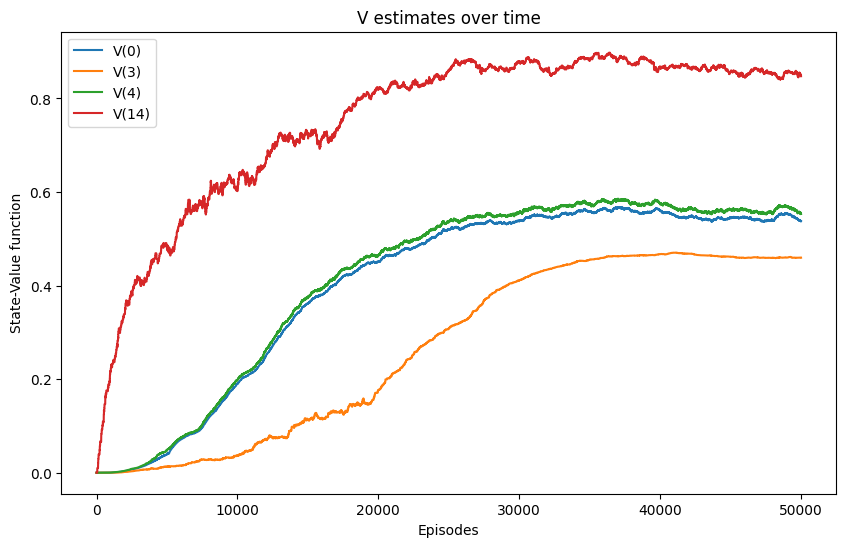

In [661]:
import matplotlib.pyplot as plt

# Filter the V_track to only include states 0, 3, 4, and 14
states_to_plot = [0, 3, 4, 14]
V_filtered = V_track[:, states_to_plot]

# Create the plot
plt.figure(figsize=(10,6))
plt.plot(V_filtered)
plt.title('V estimates over time')
plt.ylabel('State-Value function')
plt.xlabel('Episodes')
legends = ['V(0)', 'V(3)', 'V(4)', 'V(14)']
plt.legend(legends)

# Show the plot
plt.show()


The figure provides a clear visualization of the Q-learning process in Frozen Lake. It shows how the algorithm learns the value of different states over time, ultimately leading to an understanding of the optimal path to the goal.  The rapid convergence of state 14 value highlights its importance, while the slower convergence of other states indicates their relative distance or difficulty in reaching the goal.

### Taxi

A slightly more complex environment is the **Taxi environment**, where the problem involves navigating passengers in a grid world, picking them up and dropping them off at one of four locations (Red, Green, Yellow and Blue) in a 5x5 grid world. The agent can move in four directions and perform six actions: pick up, drop off, and move in each direction:

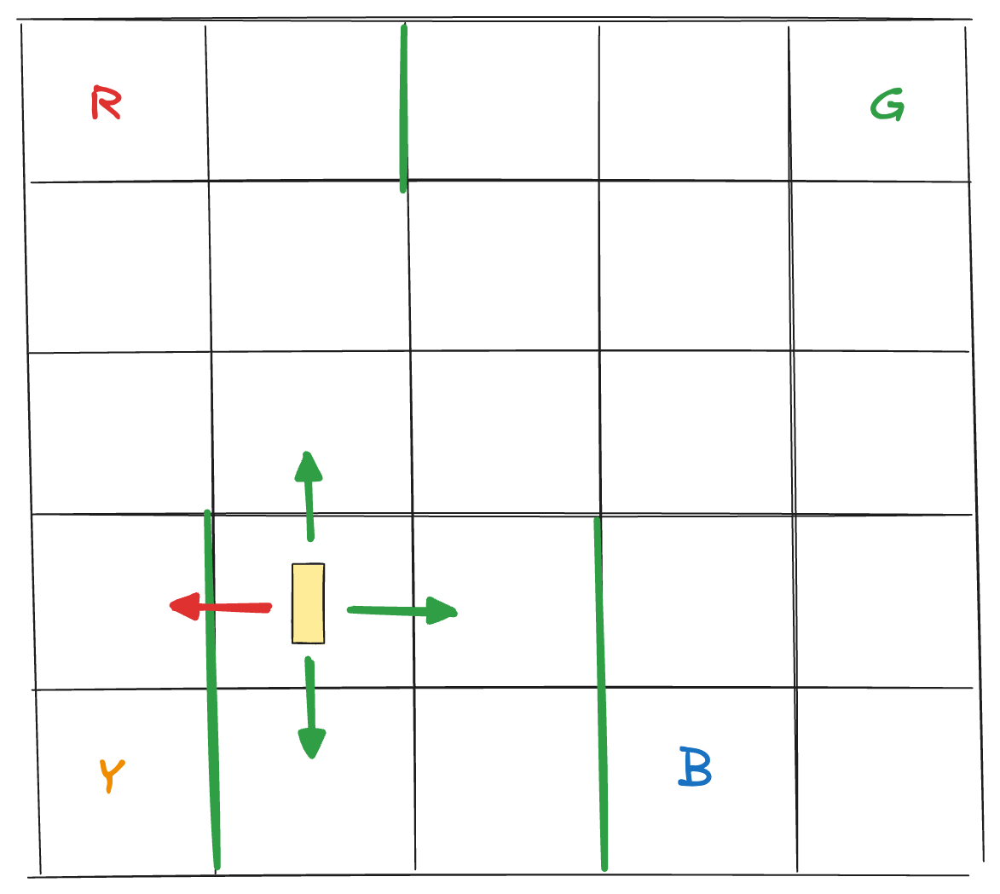

The state is described by the taxi location on the grid (a row and a column number between 0 and 4), a location to drop-off the passenger from four choices, and the passenger which can be in one of the four locations or inside the taxi, in total 500 discrete states. An observation is returned as an int that encodes the corresponding state, calculated by: 

((taxi_row * 5 + taxi_col) * 5 + passenger_location) * 4 + destination

The player receives positive rewards for successfully dropping-off the passenger at the correct location. Negative rewards for incorrect attempts to pick-up/drop-off passenger and for each step where another reward is not received. We can use Q-learning to solve the Taxi environment:

In [662]:
taxi = gym.make('Taxi-v3', render_mode="rgb_array")
pi, Q, V_track = q_learning(taxi)

The Gymnasium library provides a simple interface to get an image of the state of the environment, we can exploit this to visualize an episode:

In [663]:
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

def show_episodes(env, pi, n_episodes=1, sleep=0.5):

    # Run the episodes
    for _ in range(n_episodes):

        # Reset the environment and get the initial state
        state, info = env.reset()

        # A flag to indicate whether the episode is done
        done = False

        # Run the episode
        while not done:

            # Select an action using the policy
            action = pi(state);

            # Take a step in the environment
            state, _, terminated, truncated, _ = env.step(action)

            # Check if the episode is done
            if(terminated or truncated):
                done = True;

            # Display the environment    
            clear_output(wait=True)
            plt.imshow(env.render())
            plt.show()

            # Pause for a short time
            time.sleep(sleep)

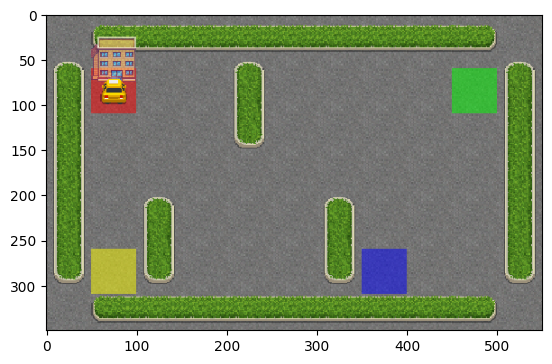

In [664]:
show_episodes(taxi, pi)

## Search vs Learning

We can explores the difference between the three paradigms of **learning to search**, **informed search**, and **adversarial search**, comparing their approaches, strengths, and applications.  

**Informed search** strategies leverage heuristics to efficiently navigate large search spaces, guiding the search toward promising solutions while reducing computational costs. Techniques such as A* and greedy best-first search exemplify how heuristic information can significantly improve search performance.  

**Adversarial search**, in contrast, addresses problems where an agent competes against an opponent, as seen in games like chess or Go. Unlike traditional search problems, adversarial settings require strategies that anticipate and counteract the actions of an opponent. Algorithms such as Minimax and Alpha-Beta pruning illustrate how search techniques can be adapted to competitive environments.  

**Learning to search** introduces machine learning techniques into the search process, allowing agents to improve their strategies over time based on experience. By learning heuristics or policies from data, these methods adapt to complex environments and can outperform traditional handcrafted heuristics in certain tasks.  

### Informed Search

In order to compare the informed search approach with one based on learning, we create a simple problem based on a maze environment. The maze consists of a grid of cells, with some cells blocked by walls. The agent can move in four directions: up, down, left, and right. The goal is to find a path from the start cell to the goal cell while avoiding obstacles. We can represent the maze as a grid, with empty cells denoted by 0 and walls denoted by 1, start and goal cells denoted by 2 and 3, respectively. We implement this environment in order to be compatible with the Gymnasium library:

In [665]:
import numpy as np

class SimpleMaze:
    def __init__(self, grid):

        self.grid = grid
        
        # Find the start (2) and goal (3) positions
        self.start = tuple(np.argwhere(grid == b'S')[0])  
        self.goal = tuple(np.argwhere(grid == b'G')[0]) 

        # Set the initial position to the start 
        self.position = self.start

        # Get the grid size
        self.n_rows, self.n_cols = grid.shape
        
        # Define possible actions: left, down, right, up
        self.actions = [(-1, 0), (0, 1), (1, 0), (0, -1)] 
        
        # Observation space: number of states (flattened grid positions)
        self.observation_space = type('Space', (), {'n': self.n_rows * self.n_cols})
        
        # Action space: number of actions
        self.action_space = type('Space', (), {'n': len(self.actions)})

        # Add `unwrapped` attribute for compatibility with Gym-style environments
        self.unwrapped = self

    # Reset the environment to the initial state
    def reset(self):
       
        # Set the initial position to the start
        self.position = self.start
        
        # Convert a (row, col) position to a single index. ""
        index = self.position[0] * self.n_cols + self.position[1]

        # Return flattened state and done status (False)
        return index, False  

    # Make a step in the environment
    def step(self, action):

        # Get the current position
        current_row, current_col = self.position
        
        # Calculate the new position based on the action
        move = self.actions[action]
        new_row, new_col = current_row + move[1], current_col + move[0]
        
        # Check if the new position is within bounds and not an obstacle (value 1)
        if 0 <= new_row < self.n_rows and 0 <= new_col < self.n_cols and self.grid[new_row, new_col] != b'H':
            self.position = (new_row, new_col)
        
        # Convert the new position to an index
        next_state_index = self.position[0] * self.n_cols + self.position[1]

        # Check if the goal is reached
        if self.position == self.goal:
            # Reward of 1 for reaching the goal, done = True
            return next_state_index, 1, True, False, {}  

        # Penalty for each step to encourage faster solutions
        return next_state_index, -0.1, False, False, {} 

    # Expose the 'desc' attribute via 'unwrapped'
    @property
    def desc(self):
        return self.grid


We write a functin to visualize in a pleasant way the maze:

In [666]:
def show_maze(maze):

    grid = maze.grid.astype(str)

    grid[maze.grid == b'W'] = "□"  # Open paths
    grid[maze.grid == b'H'] = "■"  # Obstacles
    grid[maze.grid == b'S'] = "S"  # Start
    grid[maze.grid == b'G'] = "G"  # Goal
    
    print("\n".join(" ".join(row) for row in grid))
    print()


Now we prepare a simple problem:

In [667]:
# b'S = Start 
# b'G' = Goal 
# b'H' = Obstacle 
# b'W = Walkable

grid = np.array([
    [b'H', b'H', b'H', b'H', b'H', b'H', b'H', b'H', b'H', b'H', b'H', b'H'],    
    [b'H', b'S', b'W', b'W', b'W', b'W', b'W', b'H', b'W', b'W', b'W', b'H'],  
    [b'H', b'W', b'W', b'W', b'W', b'W', b'W', b'H', b'W', b'W', b'W', b'H'],  
    [b'H', b'W', b'W', b'W', b'W', b'W', b'W', b'H', b'H', b'W', b'W', b'H'],  
    [b'H', b'H', b'H', b'H', b'H', b'H', b'W', b'W', b'W', b'W', b'W', b'H'],  
    [b'H', b'W', b'W', b'W', b'W', b'H', b'W', b'W', b'W', b'W', b'W', b'H'],  
    [b'H', b'W', b'W', b'W', b'W', b'W', b'W', b'W', b'W', b'W', b'W', b'H'],  
    [b'H', b'W', b'W', b'W', b'W', b'W', b'H', b'H', b'H', b'H', b'H', b'H'],  
    [b'H', b'W', b'W', b'W', b'W', b'W', b'H', b'W', b'W', b'W', b'W', b'H'],  
    [b'H', b'W', b'W', b'W', b'W', b'W', b'W', b'W', b'W', b'W', b'W', b'H'],  
    [b'H', b'W', b'W', b'W', b'W', b'W', b'W', b'W', b'W', b'W', b'G', b'H'],  
    [b'H', b'H', b'H', b'H', b'H', b'H', b'H', b'H', b'H', b'H', b'H', b'H'],  
])

# Create the maze environment
maze = SimpleMaze(grid)

# Show the maze
show_maze(maze)


■ ■ ■ ■ ■ ■ ■ ■ ■ ■ ■ ■
■ S □ □ □ □ □ ■ □ □ □ ■
■ □ □ □ □ □ □ ■ □ □ □ ■
■ □ □ □ □ □ □ ■ ■ □ □ ■
■ ■ ■ ■ ■ ■ □ □ □ □ □ ■
■ □ □ □ □ ■ □ □ □ □ □ ■
■ □ □ □ □ □ □ □ □ □ □ ■
■ □ □ □ □ □ ■ ■ ■ ■ ■ ■
■ □ □ □ □ □ ■ □ □ □ □ ■
■ □ □ □ □ □ □ □ □ □ □ ■
■ □ □ □ □ □ □ □ □ □ G ■
■ ■ ■ ■ ■ ■ ■ ■ ■ ■ ■ ■



We can find a policy to solve the maze using Q-learning:

In [668]:
pi, _, _ = q_learning(maze, gamma=1, beta=0.1, epsilon=0.7, n_episodes=5000)

In [669]:
show_policy("Learned", pi, maze)

Policy:  Learned
■  ■  ■  ■  ■  ■  ■  ■  ■  ■  ■  ■  
■  ⇩  ⇩  ⇩  ⇩  ⇩  ⇩  ■  ⇩  ⇩  ⇦  ■  
■  ⇩  ⇩  ⇩  ⇩  ⇩  ⇩  ■  ⇨  ⇩  ⇩  ■  
■  ⇨  ⇨  ⇨  ⇨  ⇨  ⇩  ■  ■  ⇩  ⇦  ■  
■  ■  ■  ■  ■  ■  ⇩  ⇦  ⇦  ⇦  ⇦  ■  
■  ⇨  ⇨  ⇩  ⇩  ■  ⇩  ⇦  ⇦  ⇦  ⇦  ■  
■  ⇨  ⇨  ⇨  ⇩  ⇩  ⇦  ⇦  ⇦  ⇦  ⇦  ■  
■  ⇨  ⇨  ⇩  ⇩  ⇩  ■  ■  ■  ■  ■  ■  
■  ⇨  ⇨  ⇩  ⇩  ⇩  ■  ⇩  ⇩  ⇩  ⇩  ■  
■  ⇨  ⇨  ⇩  ⇩  ⇩  ⇩  ⇩  ⇩  ⇩  ⇩  ■  
■  ⇨  ⇨  ⇨  ⇨  ⇨  ⇨  ⇨  ⇨  ⇨  ⇦  ■  
■  ■  ■  ■  ■  ■  ■  ■  ■  ■  ■  ■  



Since the maze is a deterministic problem and the player always starts from the same position, learning a complete policy is unnecessary because many states will never be encountered. Therefore, we only need to determine a single path from the start to the goal, rather than an action for every state. To find this path, we can use an informed search algorithm, such as A*, with a Manhattan distance heuristic:

In [670]:
import heapq

def a_star(maze):
        
    # Get maze information
    grid = maze.grid
    n_rows, n_cols = grid.shape
    start = maze.start
    goal = maze.goal

    # Get the possible actions
    actions = maze.actions

    # Define the heuristic function (Manhattan distance)
    def heuristic(a, b):
        return abs(a[0] - b[0]) + abs(a[1] - b[1])

    # Priority queue (min-heap) for the open list
    open_list = []
    heapq.heappush(open_list, (0 + heuristic(start, goal), 0, start))

    # Dictionary to track the best path
    came_from = {}

    # Cost from start to current node
    g_costs = {start: 0}
    
    # List to keep track of explored states
    explored_states = []

    while open_list:
        _, g, current = heapq.heappop(open_list)

        # Add the current state to the explored states list
        explored_states.append(current)

        # If the goal is reached, reconstruct the path
        if current == goal:
            print("Goal reached!")
            path = []
            while current in came_from:
                path.append(current)
                current = came_from[current]
            path.reverse()
            return path, explored_states

        # Explore neighbors
        for action in actions:
            neighbor = (current[0] + action[0], current[1] + action[1])

            # Check if neighbor is within bounds and not an obstacle
            if 0 <= neighbor[0] < n_rows and 0 <= neighbor[1] < n_cols and grid[neighbor] != b'H':
                tentative_g = g + 1  # Each step costs 1

                # If this path is better, record it
                if neighbor not in g_costs or tentative_g < g_costs[neighbor]:
                    g_costs[neighbor] = tentative_g
                    f = tentative_g + heuristic(neighbor, goal)
                    heapq.heappush(open_list, (f, tentative_g, neighbor))
                    came_from[neighbor] = current

    # If no path found
    return None, explored_states


In [671]:
path, explored_states = a_star(maze)

Goal reached!


As before we write a function to visualize the solution find by the A* in terms of path and expanded nodes:

In [672]:
def show_policy(maze, path, explored_states):
    
    grid = maze.grid.astype(str)

    grid[maze.grid == b'W'] = "□"  # Open paths
    grid[maze.grid == b'H'] = "■"  # Obstacles
    grid[maze.grid == b'S'] = "S"  # Start
    grid[maze.grid == b'G'] = "G"  # Goal

    for row, col in explored_states:
        grid[row, col] = "."

    for row, col in path:
        grid[row, col] = "P"

    print("\n".join(" ".join(row) for row in grid))
    print()


In [673]:
show_policy(maze, path, explored_states)

■ ■ ■ ■ ■ ■ ■ ■ ■ ■ ■ ■
■ . P P P P P ■ □ □ □ ■
■ . . . . . P ■ □ □ □ ■
■ . . . . . P ■ ■ . . ■
■ ■ ■ ■ ■ ■ P . . . . ■
■ □ □ □ □ ■ P . . . . ■
■ □ □ □ □ P P . . . . ■
■ □ □ □ □ P ■ ■ ■ ■ ■ ■
■ □ □ □ □ P ■ □ □ □ □ ■
■ □ □ □ □ P P P P P P ■
■ □ □ □ □ . . . . . P ■
■ ■ ■ ■ ■ ■ ■ ■ ■ ■ ■ ■



Both Q-Learning and A* successfully find a path from the start node to the goal node in the maze, but they do so in fundamentally different ways. Q-Learning learns an optimal policy over time by interacting with the environment and updating its action values based on rewards. The resulting policy provides a general strategy for navigating the maze, but the path it follows is not always the shortest, as it depends on factors such as training duration, exploration strategy, and reward structure. In contrast, A* is a search algorithm that directly computes the shortest path using a heuristic function, typically ensuring optimality (if the heuristic is admissible). Unlike Q-Learning, A* does not require training but instead efficiently evaluates possible paths in real-time. The solution it produces is deterministic and follows the most direct route to the goal. While A* excels in one-time pathfinding tasks with known environments, Q-Learning is better suited for scenarios where the environment may change over time, requiring an adaptive navigation strategy.

### Adversarial search

We can apply Q-learning also in an adversarial setting, to illustrate this we consider the game of Tic-Tac-To. The goal is to train an agent to play as the first player (X) using Q-learning. The game state at any given time represents the current board configuration. The agent can choose from up to nine possible actions, each corresponding to placing an X in one of the nine available positions. Unlike environments where immediate rewards are available after each action, Tic-Tac-Toe provides rewards only at the end of a match, similar to navigation problems where feedback is delayed until reaching a goal: +1 if it wins, -1 if it loses. 0 otherwise Pay attantion to the fact that the environment should take care about the adversary player, wich is part of the environment from the agent's perspective. We can implement the Tic-Tac-Toe environment in Python as an environment compatible with the Gymnasium library:

In [674]:
class TicTacToeEnv():
    def __init__(self, opponent):

        # Observation space: number of states (flattened grid positions)
        self.observation_space = type('Space', (), {'n': 3**9})

        # Action space: number of actions
        self.action_space = type('Space', (), {'n': 9})

        # Initialize the board
        self.board = np.zeros(9, dtype=int)
        
        # Set the first player
        self.current_player = 1

        # Set the opponent
        self.opponent = opponent

    def reset(self, seed=None, options=None):
        # Reset the board and current player
        self.board = np.zeros(9, dtype=int)  # Empty board
        self.current_player = 1 

        # Return the initial state
        return self._get_obs(), {}

    def step(self, action):
        done = False

        # Check if the action is valid
        if self.board[action] != 0:
            return self._get_obs(), -10, True, False, {}

        # Apply the agent's action
        self.board[action] = self.current_player

        # Check if the agent wins or if it's a draw
        reward, done = self._check_winner()
        if done:
            return self._get_obs(), reward, done, False, {}

        # Switch players
        self.current_player = -1 if self.current_player == 1 else 1

        # Opponent's turn        
        opponent_action = self.opponent(self.board)

        # Check if the opponent's action is valid
        if self.board[opponent_action] != 0:
            return self._get_obs(), -10, True, False, {}

        # Apply the opponent's action
        self.board[opponent_action] = self.current_player

        # Check if the opponent wins or if it's a draw
        reward, done = self._check_winner()
        if done:
            return self._get_obs(), reward * -1, done, False, {}

        # Switch players back
        self.current_player = -1 if self.current_player == 1 else 1

        return self._get_obs(), 0, done, False, {}

    def _get_obs(self):
        # Return the state as a base-3 number
        return int("".join(map(str, (self.board + 1).tolist())), 3)

    def _check_winner(self):
        # Check for a winner
        for (i, j, k) in [(0, 1, 2), (3, 4, 5), (6, 7, 8),  # Rows
                          (0, 3, 6), (1, 4, 7), (2, 5, 8),  # Columns
                          (0, 4, 8), (2, 4, 6)]:  # Diagonals
            if self.board[i] == self.board[j] == self.board[k] and self.board[i] != 0:
                return (1, True) if self.board[i] == 1 else (-1, True)
        if 0 not in self.board:
            return 0, True  # Draw
        return 0, False  # No winner yet

An essential challenge in training a Q-learning agent for adversarial search is **selecting an opponent that promotes effective learning**. Minimax, being deterministic and always choosing the optimal move, never makes exploitable mistakes, limiting the agent’s exposure to diverse game states and suboptimal strategies that encourage exploration. The lack of randomness means the Q-learning agent repeatedly faces the same optimal patterns, where mistakes are quickly punished by the best counter-move from Minimax. This **rigid environment stifles exploration and adaptation to non-optimal opponents**. To address this, a **Randomized Minimax** approach introduces variability by occasionally selecting non-optimal moves, providing the Q-learning agent with more opportunities for exploration. Additionally, in games like Tic Tac Toe, where rewards are only given at the end, reward sparsity further complicates learning, as the agent struggles to connect actions to eventual outcomes.  A **random adversary** can enhance training by introducing unpredictability, encouraging the agent to explore a wider range of strategies and game states. Unlike deterministic opponents, a random adversary prevents the agent from overfitting to repetitive patterns, fostering adaptability. It also helps overcome reward sparsity, as the agent faces varied situations, making it easier to learn associations between actions and outcomes. Overall, a random opponent promotes more effective and robust learning.

In [675]:
def random_agent(state):
    valid_actions = [i for i in range(9) if state[i] == 0]
    return np.random.choice(valid_actions)

We can run the training:

In [676]:
tictactoe = TicTacToeEnv(random_agent)
learned_pi, _, _ = q_learning(tictactoe, gamma=1, beta=0.1, epsilon=0.5, n_episodes=10000)

To evaluate the learning process, we need a function to play a game between the agent and the adversary collecting statistics about the game:

In [677]:
def calculate_success_rate(pi, num_games=10000):
    wins = 0
    draws = 0
    losses = 0

    for _ in range(num_games):
        env = TicTacToeEnv(random_agent)
        state, _ = env.reset()
        
        done = False
        while not done:
            action = pi(state)
            state, reward, terminated, truncated, _ = env.step(action)
            if terminated or truncated:
                done = True

        if reward == 1:
            wins += 1
        elif reward == 0:
            draws += 1
        else:
            losses += 1

    win_rate = wins / num_games
    draw_rate = draws / num_games
    loss_rate = losses / num_games

    return win_rate, draw_rate, loss_rate

Now we can evaluate the goodness of the learned policy:

In [678]:
win_rate, draw_rate, loss_rate = calculate_success_rate(learned_pi)

print(f"Win Rate: {win_rate}")
print(f"Draw Rate: {draw_rate}")
print(f"Loss Rate: {loss_rate}")

Win Rate: 0.9906
Draw Rate: 0.0026
Loss Rate: 0.0068


The agent performs well against a random opponent, but **its strategy is suboptimal**, as it still suffers losses. When trained against a random player, the Q-Learning agent optimizes its strategy to exploit the random mistakes rather than developing an optimal approach for the game itself. The random opponent’s irrationality leads the agent to **learn moves that work against mistakes** but are **ineffective against rational players**. This results in risky strategies that rely on the opponent's errors. Against rational opponents, these moves fail, increasing losses. The learned policy is **overfitted** to the random opponent, lacking robustness. To improve the agent, we can train it against a variety of opponents, including stronger ones, through **self-play**, **mixing strategies**, or **curriculum learning**, where the agent gradually faces tougher challenges.

## Deep Reinforcement Learning

The main drawback of Q-learning is that it use of a table to represent value functions, for this reason we call it and other similar approaches **tabular reinforcement learning**: 

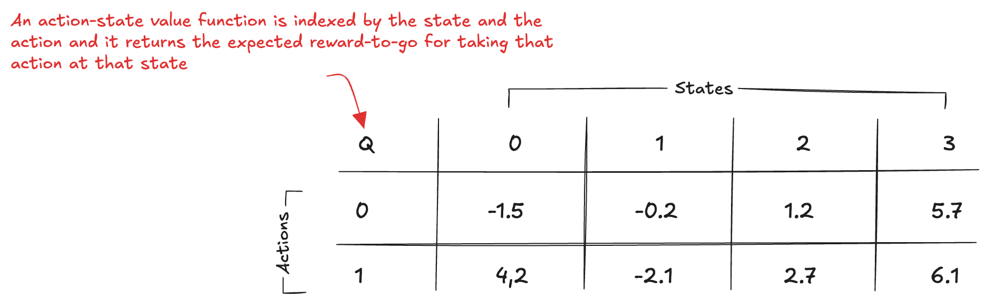

It is **impractical for complex problems**, as many reinforcement learning tasks involve **combinatorially large state spaces**. Environments often have high-dimensional states, where each state comprises numerous variables. For example, in a video game, the state may be represented by the pixels on the screen, making learning and decision-making significantly more challenging:

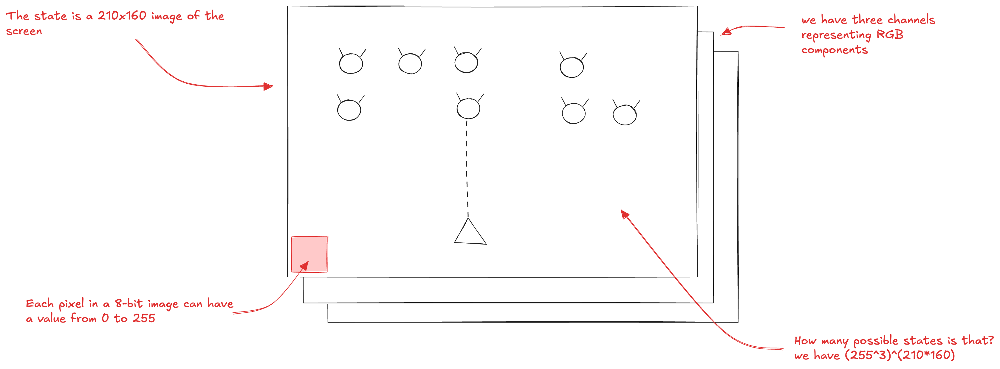

The challenge worsens when states include **continuous variables**, which can take infinitely many values. Creating a table to account for all possibilities is infeasible. While discretizing the state space helps, it still results in an overwhelming number of values, making tabular solutions impractical due to the sheer size of the matrices.

The issue is not only memory consumption but also the **time needed to fill large tables** accurately. In many tasks, most states are new, requiring **generalization** from similar past experiences. The challenge lies in using experience from a limited subset of states to approximate a good policy over a larger space. Tabular solutions are inefficient as they cannot learn from unseen states based on similarities.

Function **approximation** and **generalization** have been extensively studied in **supervised machine learning**. The goal is to substitute the tabular representation with a **neural network** that can approximate the table in a more compact form and generalize experience also to unseen but similar states. This approach is known as **Deep Reinforcement Learning**.

Fixing the random seed in neural network experiments ensures reproducibility, allowing results to be consistently replicated and facilitating fair comparisons between different model configurations.

In [679]:
import torch;
import numpy as np;
import random;

# set the seeds for reproducibility of results
seed = 28;

torch.manual_seed(seed);
np.random.seed(seed);
random.seed(seed);

### The Cart-pole environment

To illustrate the need for generalization, we use the classic **Cart-pole** control problem, where the goal is to balance a pole on a cart moving along a frictionless track. The state space is low-dimensional but **continuous**. While training is fast, it remains challenging, and function approximation can help:

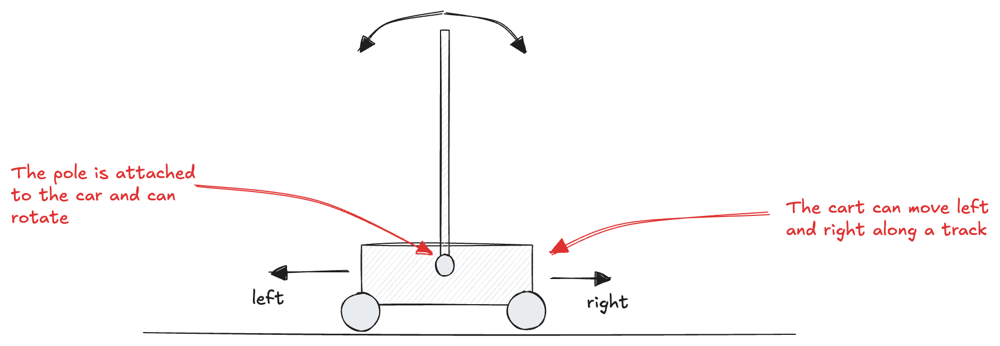

The state space is comprised of four variables:
- position of the cart on the track (x) with a range from –2.4 to 2.4; 
- velocity of the cart along the track (vc) with a range from –inf to inf; 
- angle of the pole (theta) with a range of –40 degrees to 40 degrees; 
- velocity at the tip (vp) of the pole with a range of –inf to inf.

There are two available actions in every state: 
- action 0 applies a –1 force to the cart (push it left)
- action 1 applies a +1 force to the cart (push it right)

The cart reach a terminal state if: 
- the angle theta is more than 12 degrees away from the vertical position; 
- the center or the cart is more than 2.4 units from the center of the track; 
- the episode count reaches 500 time steps. 

The reward function is +1 for every time step. The environtment is available in the Gymnasium library.

In [680]:
cartpole = gym.make('CartPole-v1', render_mode="rgb_array");
cartpole.np_random = np.random.Generator(np.random.PCG64(seed));

We can get the state space and the action space sizes of the environment:

In [681]:
state_size = cartpole.observation_space.shape;
action_size = cartpole.action_space.n;

print('State Space: ', state_size);
print('Action Space: ', action_size);

State Space:  (4,)
Action Space:  2


We can show an episode with a random policy:

In [682]:
def random_pi(state):
    return np.random.choice([0,1]);

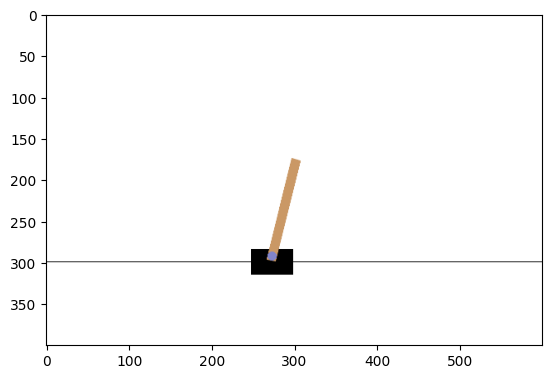

In [683]:
show_episodes(cartpole, random_pi, n_episodes=1, sleep=0)

We need a function to evaluate the performance of the agent. However the probability of success used for the grid-world environment is not suitable, we need somthing more informative, related to the time the pole is balanced. We will can use the average reward over a number of episodes as our metric:

In [684]:
def evaluate_rewards(env, pi, episodes=1):

    # Create a list to store the rewards
    rewards = [];

    # Run the episodes
    for episode in range(episodes):

        # Reset the environment and get the initial state
        state, done = env.reset()[0], False;

        # Initialize the episode reward
        rewards.append(0);

        # Run the episode
        while not done:
            
            # Select an action using the policy
            action = pi(state);

            # Take a step in the environment
            new_state, reward, terminal, truncated, _ = env.step(action)
            
            # Update the episode reward
            rewards[-1] += reward;

            # Check if the episode is done
            done = terminal or truncated;

            # Move to the new state
            state = new_state;

    # Return the mean reward over the episodes
    return np.mean(rewards);

Check the performance of a random policy as a baseline:

In [685]:
random_score = evaluate_rewards(cartpole, random_pi, episodes=100);
print("Random score", random_score);

Random score 20.72


The random agent performs poorly, balancing the pole for only a short time. Tabular methods are unsuitable due to the continuous state space and function approximation is needed to generalize.

### Artificial Neural Networks

An **Artificial Neural Network** is a model inspired by the network of biological neurons in the brain. A neuron consists of a **cell body** containing the **nucleus** and other components, **dendrites** (branching extensions), and a long extension called the **axon**. The axon can be several times longer than the cell body or even tens of thousands of times longer. At its end, the axon branches into **telodendria**, where **synapses** connect to the dendrites or cell bodies of other neurons:

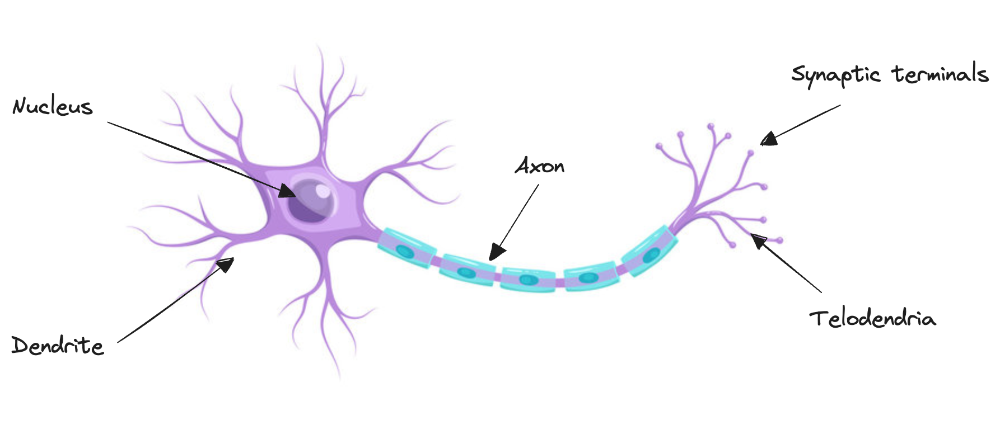

Biological neurons generate **action potentials**, electrical impulses that travel along the axon and trigger synapses to release chemical signals called **neurotransmitters**. When a neuron receives enough neurotransmitters within milliseconds, it fires its own electrical impulses, though some neurotransmitters can inhibit this firing. Individual biological neurons behave simply, but they form a **vast network of billions**, each connected to thousands of others. Complex computations arise from this network of simple neurons. While the architecture of biological neural networks is still under study, parts of the brain, like the cerebral cortex, are organized into consecutive layers.

ANNs are inspired by networks of biological neurons. Similarly, they consist of a densely interconnected set of simple units, each receiving real-valued inputs (often from other units) and producing a single real-valued output, which may serve as input to many other units. The human brain contains about 10^11 neurons, each connected to roughly 10^4 others. Neuron activity is influenced by connections to other neurons, with switching times around 10^-3 seconds. Despite this relatively slow pace, humans make complex decisions quickly, such as recognizing a familiar face in 10^-1 seconds, which involves only a few hundred neural steps. This suggests that the brain's information-processing abilities rely on **highly parallel processes** and distributed representations across many neurons. ANN systems aim to replicate this parallel computation, though they have diverged significantly from biological systems. Some researchers even argue that the biological analogy should be abandoned to foster more creative approaches.

The [**perceptron**](./papers/(1958)%20-%20The%20perceptron-%20A%20probabilistic%20model%20for%20information%20storage%20and%20organization%20in%20the%20brain.pdf) is the implementation of a single neuron and computes a weighted sum of its inputs: 

$\displaystyle z = w_0 + w_1 x_1 + w_2 x_2 + ... + w_n x_n = \sum\limits_{i=0}^{n}{w_i x_i} = w^Tx$

then the weighted sum is passed through an **activation function**, which is a non linear function that introduces non-linearity in the model. A simple activation function is the **step function**, which loosely resembles the one of the real neuron, as it sums synaptic inputs and "fires" when the membrane potential reaches a threshold, triggering ion channel openings:

$\displaystyle y = f(z) =  \Bigg \{ \begin{matrix} 1 \enspace  \text{if} \enspace  z \geq 0 \\ 0 \enspace  \text{if} \enspace  z < 0 \end{matrix}$

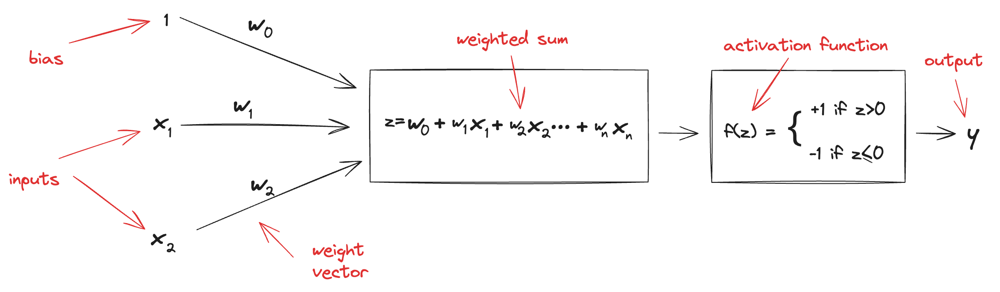

The formula can be compactly written as:

$\displaystyle y = f(w^Tx)$

where w is the weight vector, x is the input vector, and f is the activation function.

In [686]:
def step(z):
    return np.where(z >= 0, 1, 0)

In [687]:
def perceptron(weights, x, activation):

    # add bias
    x = np.concatenate(([1], x))
    
    # calculate the weighted sum
    z = np.dot(weights, x)

    # apply the non-linear function
    y = activation(z)

    return y

A perceptron performs linear binary classification by outputting the positive class if the result exceeds a threshold, and the negative class otherwise. Training involves adjusting weights to find optimal values. With the right weights, it can solve simple problems, such as an AND gate:

In [688]:
and_weights = [-3, 2., 2]

print("0 AND 0: ", perceptron(and_weights, [0, 0], step))
print("0 AND 1: ", perceptron(and_weights, [0, 1], step))
print("1 AND 0: ", perceptron(and_weights, [1, 0], step))
print("1 AND 1: ", perceptron(and_weights, [1, 1], step))

0 AND 0:  0
0 AND 1:  0
1 AND 0:  0
1 AND 1:  1


The main challenge is adjusting the model parameters so the neuron performs the task correctly. The **training procedure** considers the error made by the network during predictions. The learning rule **reinforces** connections that reduce the error. The neuron processes one training instance (or a batch) at a time, making predictions and adjusting **weights to minimize errors** for incorrect predictions. To understand how the weights are adjusted, we need to define an error function, commonly the **Mean Squared Error (MSE)**, which measures the difference between the model's predictions and target values:

$\displaystyle J(w) = \frac{1}{m} \sum\limits_{i=1}^{m}{(\hat{y}^{(i)} - y(x^{(i)},w))^2}$

The minimum of this function corresponds to the weight values that best fit the training data. To find this minimum, we use the gradient descent algorithm, starting with an initial guess for the weights and iteratively adjusting them based on the error function. The weight update is formally:

$\displaystyle w_j = w_j - \eta \frac{\partial J}{\partial w_j}$

where $\eta$ is the **learning rate** and it is a hyperparameter that determines how much the weights are adjusted at each iteration of the training.

We can now calculate the gradient. For this we have to recall the chain rule from calculus: 

$\displaystyle \frac{\partial g(h(x))}{\partial x} = \frac{\partial g}{\partial h} \frac{\partial h}{\partial x}$

So, we can write:

$\displaystyle \frac{\partial J}{\partial w_j} = \frac{\partial J}{\partial y} \frac{\partial y}{\partial w_j} = \frac{2}{m} \sum\limits_{i=1}^{m} \left ( (\hat{y}^{(i)} - y(x^{(i)},w)) (-1)\frac{\partial y}{\partial w_j} \right )$

The first part of the sum is called **delta term**:

$\displaystyle \delta(x^{(i)},w) = \hat{y}^{(i)} - y(x^{(i)},w)$

and the derivative term can be expressed using agin the chain rule:

$\displaystyle \frac{\partial y}{\partial w_j} = \frac{\partial f}{\partial z} \frac{\partial z}{\partial w_j} = \frac{\partial f}{\partial z} \frac{\partial w^Tx}{\partial w_j} = \frac{\partial f}{\partial z} x_j$ 

Composing all terms, we can write the learning rule as (removing the multiplicative factor 2):

$\displaystyle w_j = w_j + \eta \frac{1}{m} \sum\limits_{i=1}^{m} \delta(x^{(i)},w) \frac{\partial f}{\partial z}x_j$

Notice that in the formula we have the derivative of the activation function and this is the main reason to replace the step function (that contains only flat segments, so there is no gradient to work with) **with a smooth function** (e.g. the sigmoid that has a well-defined nonzero derivative everywhere):

$\displaystyle f(z) = \sigma(z) = \frac{1}{1 + e^{-z}}$

In [689]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

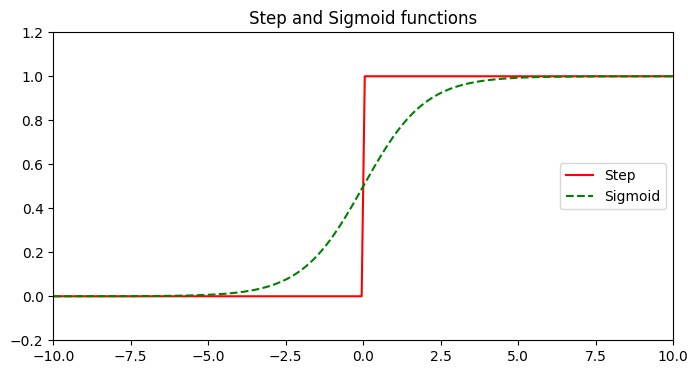

In [690]:
plt.figure(figsize=(8,4))

x = np.linspace(-10, 10, 200)
plt.plot(x, step(x), "r-", label="Step")
plt.plot(x, sigmoid(x), "g--", label="Sigmoid")

plt.legend(loc="center right")
plt.title("Step and Sigmoid functions")
plt.axis([-10, 10, -0.2, 1.2])

plt.show()

In the case of a the sigmoid function, the derivative is:

$\displaystyle \frac{\partial f}{\partial z} = \frac{\partial }{\partial z} \frac{1}{1 + e^z} = \frac{e^z}{(1+e^z)^2} = y(1-y)$

In [691]:
def sigmoid_derivative(x):
    return sigmoid(x) * (1 - sigmoid(x))

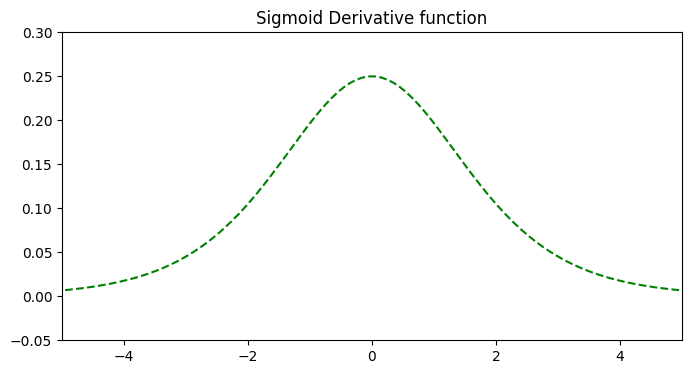

In [692]:
plt.figure(figsize=(8,4))

x = np.linspace(-10, 10, 200)
plt.plot(x, sigmoid_derivative(x), "g--")

plt.title("Sigmoid Derivative function")
plt.axis([-5, 5, -0.05, 0.3])

plt.show()

In that case we have the **sigmoid perceptron**:

$\displaystyle y(x,w) = \sigma(w^Tx) = \frac{1}{1 + e^{-w^Tx}}$

and the update rule is:

$\displaystyle w_j = w_j + \eta \frac{1}{m} \sum\limits_{i=1}^{m} \left ( \delta(x^{(i)},w) y(x^{(i)},w)(1-y(x^{(i)},w))x^{(i)}_j \right )$

In [693]:
def training_perceptron(x, y, weights, eta=0.1, epochs=3000):

    # Number of training examples
    m = len(y)  

    # Repeat the training for the specified epochs
    for epoch in range(epochs):

        # Initialize the total error
        total_error = 0

        # Loop over each training example
        for i in range(m):

            # Add bias to the input
            xi = np.concatenate(([1], x[i]))  
            yi = y[i]
            
            # Compute the prediction
            output = perceptron(weights, x[i], sigmoid)
            
            # Compute the error delta
            delta = (yi - output) * sigmoid_derivative(output)
            
            # Update weights using the update rule
            for j in range(len(weights)):
                weights[j] += eta * delta * xi[j]
    
    # Return the updated weights
    return weights

We can learn the correct weights for the AND gate providing examples of the truth table:

In [694]:
# Define the input and output for the AND function
x = np.array([[0, 0],
              [0, 1],
              [1, 0],
              [1, 1]])
y = np.array([0, 0, 0, 1])

# Initialize weights randomly, including one for the bias
weights = np.random.rand(3)

# Train the perceptron
weights = training_perceptron(x, y, weights)

print("Trained Weights: ", weights)

# Test the perceptron with the AND function
print("0 AND 0: ", perceptron(weights, [0, 0], sigmoid))
print("0 AND 1: ", perceptron(weights, [0, 1], sigmoid))
print("1 AND 0: ", perceptron(weights, [1, 0], sigmoid))
print("1 AND 1: ", perceptron(weights, [1, 1], sigmoid))

Trained Weights:  [-7.55110502  4.84434218  4.84238918]
0 AND 0:  0.0005252530513796765
0 AND 1:  0.062461009272098605
1 AND 0:  0.06257547378012919
1 AND 1:  0.894317953600663


The Perceptron is a powerful tool, however there are problems that simply can’t be solved. In their 1969 monograph Perceptrons, Marvin Minsky and Seymour Papert highlighted the fact that it is **incapable of solving some trivial problems (e.g., the exclusive OR) classification problem**:

In [695]:
# Define the input and output for the XOR function
x = np.array([[0, 0],
              [0, 1],
              [1, 0],
              [1, 1]])
y = np.array([0, 1, 1, 0])

# Initialize weights randomly
weights = np.random.rand(3)

# Train the perceptron
weights = training_perceptron(x, y, weights)

print("Trained Weights: ", weights)

print("1 xOR 1: ", perceptron(weights, [1, 1], sigmoid))
print("0 xOR 1: ", perceptron(weights, [0, 1], sigmoid))
print("1 xOR 0: ", perceptron(weights, [1, 0], sigmoid))
print("0 xOR 0: ", perceptron(weights, [0, 0], sigmoid))

Trained Weights:  [ 0.01325688 -0.02362121 -0.01180264]
1 xOR 1:  0.4944584828435549
0 xOR 1:  0.5003635594850407
1 xOR 0:  0.4974089395642136
0 xOR 0:  0.5033141714500328


To address the limitations of the perceptron, we can use a **Multilayer Perceptron (MLP)**, consisting of an input layer, one or more **hidden layers**, and an **output layer**. Neurons are interconnected to form a directed acyclic graph:

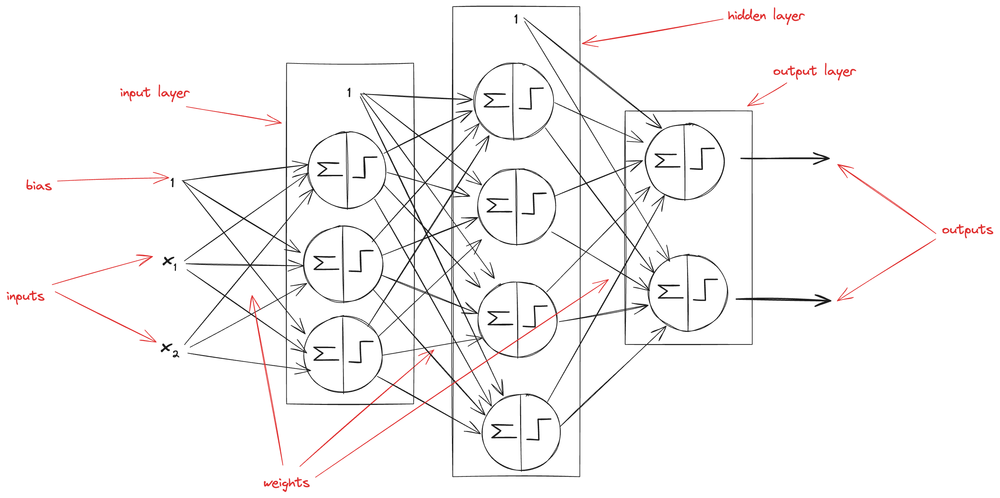

In general, ANNs can be **graphs with many types of structures-acyclic or cyclic, directed or undirected**. We now focus on the most common and practical
architecture: a fixed structure that corresponds to a directed acyclic graph. We can describe an MLP using a list of layers, where each layer is the list of the weights of all neurons in that layer:

In [696]:
def layer(neurons, inputs, activation):

    # store the outputs of each neuron
    outputs = []
    
    # iterate through each neuron in the layer
    for neuron in neurons:
    
        # add bias term (1) to the input vector
        inputs_with_bias = np.concatenate(([1], inputs))
    
        # calculate the weighted sum
        weighted_sum = np.dot(inputs_with_bias, neuron)
    
        # apply sigmoid function to the weighted sum
        output = activation(weighted_sum)
    
        # store the output of the current neuron
        outputs.append(output)
    
    return np.array(outputs)

And the network can be represented as a list of layers:

In [697]:
network = [# hidden layer: 2 neurons
            np.array([[-30, 20, 20],       
                      [-10, 20, 20]]),     
          # output layer , 1 neuron
            np.array([[-30, -60, 60]])]

The MLP output is computed by propagating the input through all layers. A sample is passed to the input layer, which sends it to the first hidden layer. The algorithm computes the output of each neuron in this layer, passing the result to the next hidden layer until the final output layer is reached. This process is called the **forward pass**. To illustrate, consider a three-layer neural network with two inputs and one output:

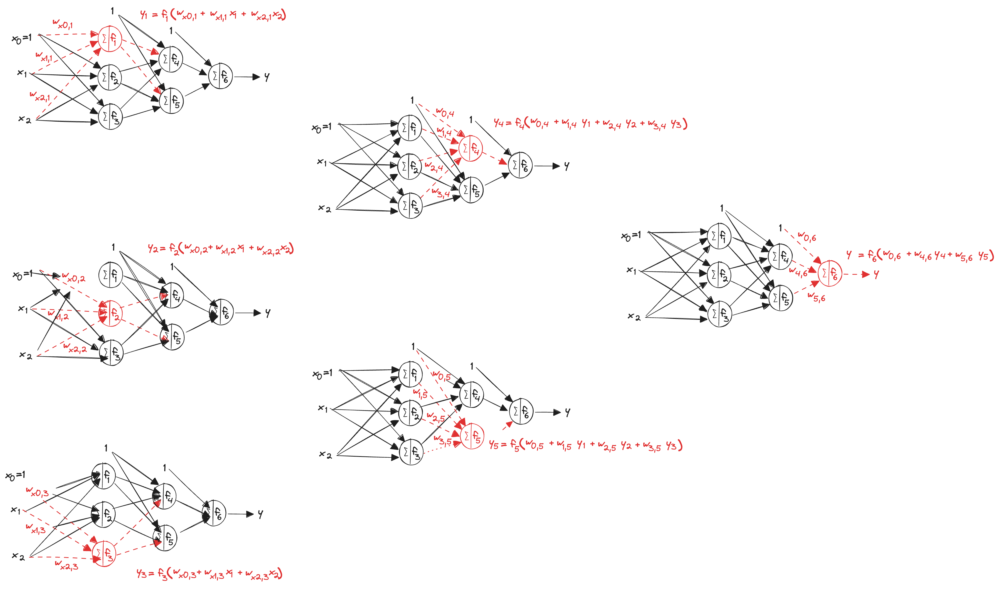

In [698]:
def forward(network, inputs, activation):

    # iterate through each layer (forward)
    for neurons in network:
        
        # calculate the output of the current layer
        outputs = layer(neurons, inputs, activation)
        
        # the output of the current layer becomes the input to the next layer
        inputs = outputs
    
    return outputs

Using this more powerful structure, we can build also the XOR gate that we couldn’t build with a single perceptron:

In [699]:
print("0 xOR 0: ", forward(network, np.array([0, 0]), sigmoid))
print("0 xOR 1: ", forward(network, np.array([0, 1]), sigmoid))
print("1 xOR 0: ", forward(network, np.array([1, 0]), sigmoid))
print("1 xOR 1: ", forward(network, np.array([1, 1]), sigmoid))

0 xOR 0:  [9.38314668e-14]
0 xOR 1:  [1.]
1 xOR 0:  [1.]
1 xOR 1:  [9.38314668e-14]


Similar to the perceptron, training an MLP requires a method to find the optimal weights for a given problem. While we can compare the desired and actual outputs to measure the error for the output layer, computing the error for internal layers is challenging because their outputs are unknown. For years, an effective training method for multilayer networks was elusive. It wasn’t until the mid-1980s that the [**backpropagation algorithm**](./papers/(1986)%20-%20Learning%20representations%20by%20back-propagating%20errors.pdf) was developed to address this issue. The core idea is to **propagate the error signal backward through the network**, using the same weights used in predictions. It calculates the partial derivatives of the cost function with respect to each weight, showing **how the cost changes when a weight is adjusted**, and uses Gradient Descent to iteratively update the weights until the network converges. First we have a **forward pass** to compute the output of the network:

In [700]:
def forward_pass(network, inputs, activation):
    
    # store the inputs and outputs of each layer
    layer_inputs = []
    layer_outputs = []

    for layer in network:
        
        # store the inputs of the current layer
        layer_inputs.append(inputs)
        
        outputs = perceptron(layer, inputs, activation)
        
        # store the outputs of the current layer
        layer_outputs.append(outputs)
        
        inputs = outputs
    
    return layer_inputs, layer_outputs

Then, a backward pass to compute the error and update the weights. The weights used to propagate back are equal to these used during the computation of the output value. Only the direction of the data flow is changed: 

$\displaystyle \delta_j = \sum\limits_{k\epsilon \text{ds}(j)}w_{jk}\delta_k$

This reverse pass efficiently measures the error gradient across all the connection weights in the network by propagating the error gradient backward through the network (hence the name of the algorithm):

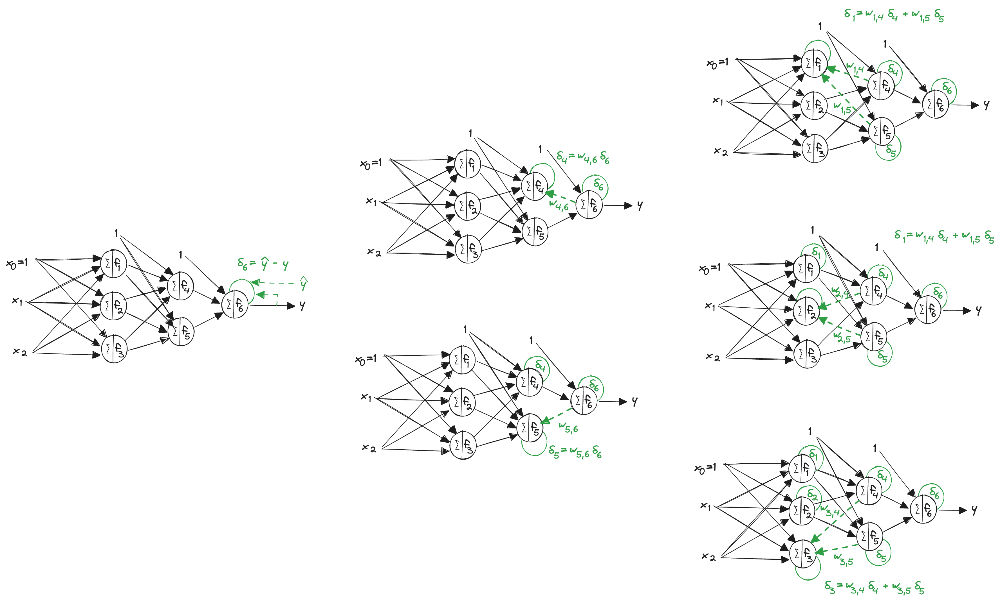

In [701]:
def backward_pass(network, targets, layer_outputs):

    # store the errors of each layer
    layer_errors = []
    
    # Calculate errors for the output layer
    errors = (targets - layer_outputs[-1])   
    layer_errors.insert(0, errors)
    
    # propagate the error through the network backwards
    for layer in reversed(network):
    
        # store the errors of each neuron in the hidden layer 
        hidden_errors = []
    
        # propagate the error to the previous layer
        for weights in layer.T:
            error = np.dot(weights, errors)
            # save the error for later use
            hidden_errors.append(error)
    
        # remove the propagated error on the bias term
        # the errors for the previous layer are the current errors
        errors = np.array(hidden_errors)[1:]
    
        # store the errors of the current layer
        layer_errors.insert(0, errors) 

    return layer_errors

Finally, the algorithm performs a learning step to tweak all the connection weights using the errors just computed. The rule used is actually similar to the delta rule used for single neuron, it updates the weights in proportion to the learning rate, the input to which the weight is applied, and the error. The difference is that the error term is the one evaluated in backward pass:

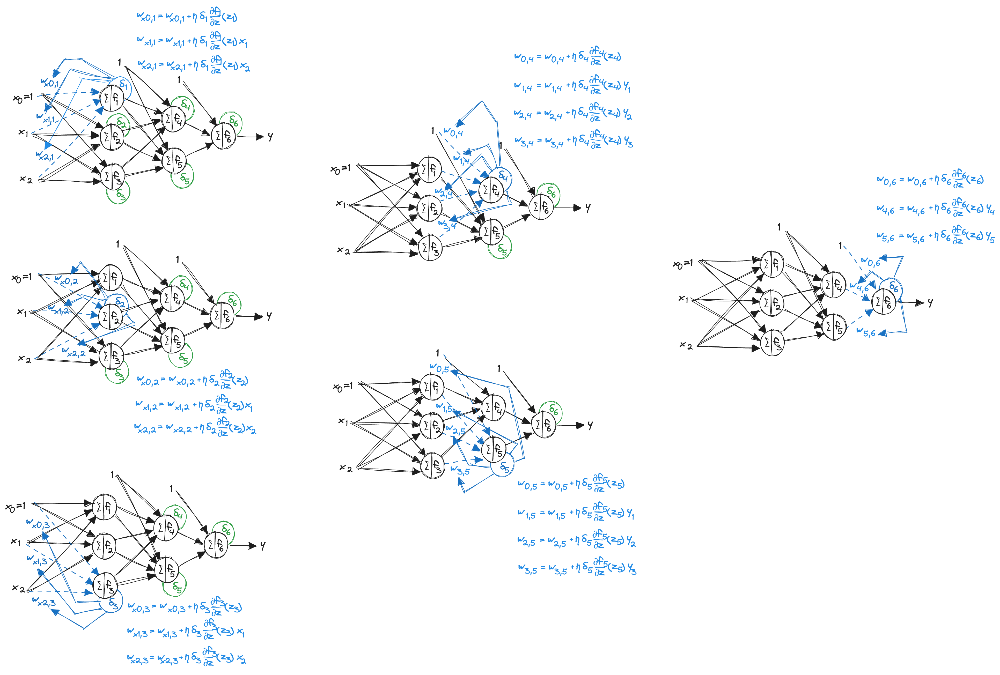

In [702]:
def update_pass(network, layer_errors, layer_inputs, learning_rate, derivative):    
    
    # iterate through each layer
    for i, layer in enumerate(network):
    
        # iterate through each neuron in the layer
        for j, neuron in enumerate(layer):
    
            # get the neuron inputs, output and error
            input_with_bias = np.concatenate(([1], layer_inputs[i]))
    
            # update the weights of the neuron
            weighted_sum = np.dot(input_with_bias, neuron)
            neuron += learning_rate * layer_errors[i+1][j] * input_with_bias * derivative(weighted_sum)

In summary for each training instance (or a batch of samples), the backpropagation algorithm first makes a prediction (forward pass) and measures the error, then goes through each layer in reverse to measure the error contribution from each connection (reverse pass), and finally tweaks the connection weights to reduce the error (Gradient Descent step). As a result of the weight adjustments, **internal hidden neurons (which are not part of the input or output) come to represent important features of the task domain**, and the regularities in the task are captured by the interactions of these units.

In [703]:
def backpropagation_pass(network, inputs, targets, learning_rate, activation, derivative):
    layer_inputs, layer_outputs = forward_pass(network, inputs, activation)
    layer_errors = backward_pass(network, targets, layer_outputs)
    update_pass(network, layer_errors, layer_inputs, learning_rate, derivative)

Let’s try to learn the XOR network we previously designed by hand. We start by generating the training data and initializing our neural network:

In [704]:
# training data
xs = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])
ys = np.array([[0], [1], [1], [0]])

# start with random weights
network = [ # layer: 2 neurons with 3 inputs
            np.random.rand(2, 3),
            # layer: 1 neuron with 3 inputs
            np.random.rand(1, 3)
          ]

learning_rate = 0.4
epochs = 15000;

for i in range(epochs): 
    for x,y in zip(xs, ys):
        backpropagation_pass(network, x, y, learning_rate, sigmoid, sigmoid_derivative);

print("0 xOR 0: ", forward(network, np.array([0, 0]), sigmoid))
print("0 xOR 1: ", forward(network, np.array([0, 1]), sigmoid))
print("1 xOR 0: ", forward(network, np.array([1, 0]), sigmoid))
print("1 xOR 1: ", forward(network, np.array([1, 1]), sigmoid))

0 xOR 0:  [0.00935553]
0 xOR 1:  [0.49356499]
1 xOR 0:  [0.98902288]
1 xOR 1:  [0.49387043]


ANNs are powerful tools, but tackling complex problems, like detecting hundreds of object types in high-resolution images, requires **deeper networks** with many layers and neurons. **Deep Neural Networks (DNNs)** are characterized by multiple hidden layers between input and output, allowing the network to **learn hierarchical data representations**, with higher layers capturing **increasingly abstract features**. In contrast, **shallow networks** with only one or two hidden layers struggle to capture complex patterns and are more suited to simpler tasks. Training DNNs is more challenging due to the need to store intermediate values during the forward pass for the backward pass in backpropagation. Optimized libraries like [**PyTorch**](https://pytorch.org/) offer efficient implementations for these tasks. For example, we can use PyTorch to build a simple shallow network for the XOR problem:

In [705]:
import torch
import torch.nn as nn
import torch.optim as optim

def xor_model(x):

    # Hidden layer with 4 neurons and sigmoid activation
    hidden = torch.sigmoid(torch.mm(x, W1) + b1)

    # Output layer with 1 neuron and sigmoid activation
    output = torch.sigmoid(torch.mm(hidden, W2) + b2)
    
    return output

# Initialize weights and biases for each layer
W1 = torch.randn(2, 4, requires_grad=True)  # 2 inputs -> 4 hidden layer neurons
b1 = torch.randn(4, requires_grad=True)     # Bias for hidden layer
W2 = torch.randn(4, 1, requires_grad=True)  # 4 hidden layer neurons -> 1 output neuron
b2 = torch.randn(1, requires_grad=True)     # Bias for output layer

# Loss function (Mean Squared Error)
criterion = nn.MSELoss()

# Optimizer (Stochastic Gradient Descent)
optimizer = optim.SGD([W1, b1, W2, b2], lr=0.1)

We apply it to the problem:

In [706]:
# XOR input and output
X = torch.tensor([[0, 0], [0, 1], [1, 0], [1, 1]], dtype=torch.float32)
y = torch.tensor([[0], [1], [1], [0]], dtype=torch.float32)

# Training loop
epochs = 10000
for epoch in range(epochs):
    # Forward pass
    output = xor_model(X)
    
    # Compute the loss
    loss = criterion(output, y)
    
    # Backward pass, and update weights
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

# Test the trained model
with torch.no_grad():
    predictions = xor_model(X)
    print("Predictions:")
    print(predictions)

Predictions:
tensor([[0.0658],
        [0.9192],
        [0.9424],
        [0.0762]])


### Neural Fitted Q (NFQ)

The [**Neural Fitted Q**](./papers/(2005)%20-%20Neural%20Fitted%20Q%20Iteration.pdf) is one of the first algorithms to successfully **use neural networks as a function approximation** to solve reinforcement learning problems. We refer to the approximate action-value function estimate as: 

$\displaystyle Q(s,a; \theta)$

which means the estimate is parameterized by the **weights** of a neural network. In order to design the function approximator, we can observe that the matrix holding the action-value function was indexed by state and action pairs, so a straightforward neural network architecture can take in input the state and the action to evaluate, and it can output a single value representing the value for that state-action pair:

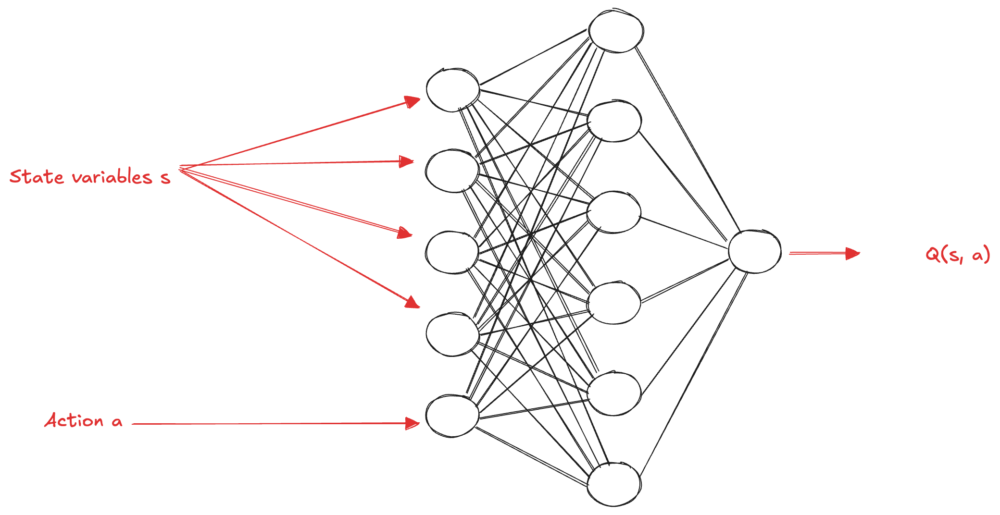

This architecture would work fine, but a more efficient one consists of **only inputting the state to the neural network and outputting the Q-values for all the actions** in that state. In that way when using exploration strategies such as epsilon-greedy, we have to do **only one pass forward to get the values of all actions**:

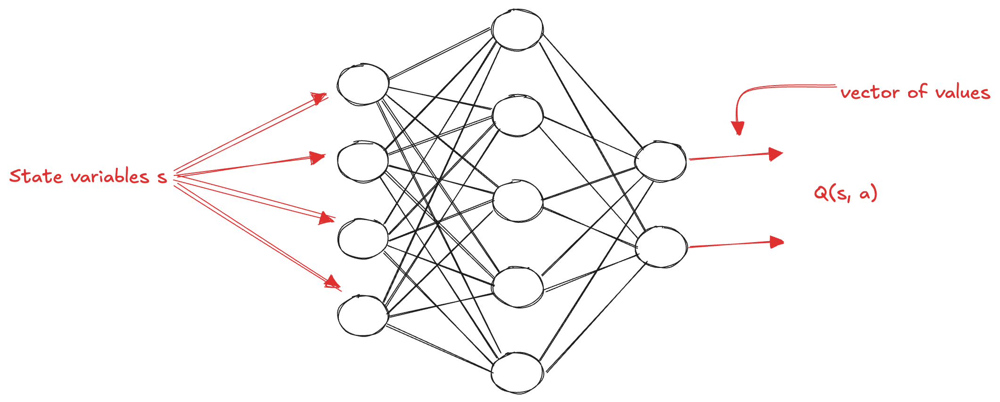

Notice that The state is passed through the network, which learns to approximate the action-value function, **eliminating the need to store values** for every state-action pair. This generalization enables the handling of large or continuous environments, where enumerating or storing all possible states is impractical:

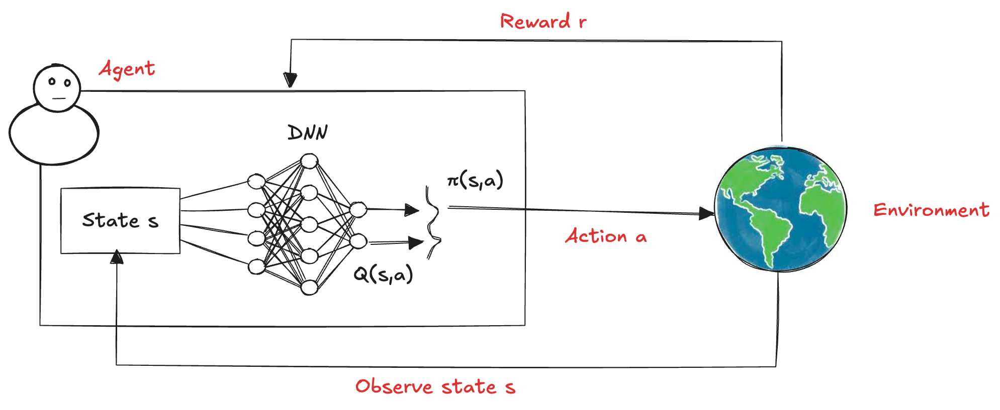

We can implement the function approximator for the CartPole example: the ANN has two hidden layers, containing 512 and 128 neurons, using a sigmoid activation function. The output layer will use a linear activation function to directly output the values. The input layer will have four neurons, one for each state variable:

In [707]:
ann = torch.nn.Sequential(
        torch.nn.Linear(state_size[0], 512),  
        torch.nn.ReLU(),                           
        torch.nn.Linear(512, 128),
        torch.nn.ReLU(),
        torch.nn.Linear(128, action_size));

We can create a policy by acting greedily with respect to the Q-values stored by the neural network:

In [708]:
def ann_pi(state):
    
    # convert the state into a tensor
    state = torch.FloatTensor(state);

    # calculate q_values from the network
    Q_values = ann(state).detach();

    # act greedy
    action = np.argmax(Q_values).data.numpy();

    # return the action
    return action;

To train the ANN, we need a dataset, however, in reinforcement learning, we don't have a predefined dataset, so we must collect experiences from the environment. We use an **experience batch** to store these experiences during interacion with the environment:

In [709]:
batch_size = 1024;

experience_type = np.dtype([
    ('state', np.float32, (state_size)), 
    ('action', np.int8),                  
    ('reward', np.float32),               
    ('next_state', np.float32, (state_size)),  
    ('failure', np.int8)                  
])

experiences_batch = np.empty(shape=(batch_size,), dtype=experience_type);

Moreover, we need to collect the batch of experiences from the environment using an exploration stratefy (e.g. epsilon-greedy):

In [710]:
import random

def epsilon_greedy(state, action_size, epsilon):

    # if random number is less than epsilon, act randomly
    if random.uniform(0,1) < epsilon:
        return np.random.randint(action_size);
    
    # else, act greedily
    else:
        # convert the state into a tensor
        state = torch.FloatTensor(state);

        # calculate q_values from the network
        Q_values = ann(state).detach();
        
        # act greedy
        action = np.argmax(Q_values).data.numpy();
        
        # return the action    
        return action; 

We face another problem, we need an error function to measure the network's performance. In supervised learning, this is straightforward, as we have a dataset with known correct outputs. However, in our case, we **don't have access to the "true" values** of the collected esperience dataset. Ideally, the error would be calculated using the "true" action-value function Q*, based on the experiences we've gathered:

$\displaystyle L(\theta)=E_{s,a}[(Q_*(s,a)-Q(s,a;\theta))^2]$

We don't have access to Q* (or learning wouldn't be needed), but we can use principles from Q-Learning and estimate the error with **Temporal Difference (TD) error**:

$\displaystyle Q^\text{Q-learning}(S_t, A_t) = Q(S_t, A_t) + \alpha [ R_{t+1} + \gamma  \underset{a}{\text{ max }} Q(S_{t+1}, a) - Q(S_t, A_t) ]$

Using this target, we can define the error function as the difference between the current Q-value and the new value that should be assigned:

$\displaystyle J(\theta)=E_{s,a} \left[ ( r + \gamma \underset{a}{\text{ max }} Q(s',a;\theta) - Q(s,a;\theta))^2 \right]$

However, with non-linear function approximation, **convergence guarantees no longer apply**. In the NFQ implementation, we begin with a randomly initialized action-value function, evaluate it by sampling actions, improve it with an exploration strategy (e.g., epsilon-greedy), and iterate until the desired performance is achieved. The "true values" are targets derived from the network’s predictions, including the next state value, creating a circular dependency:

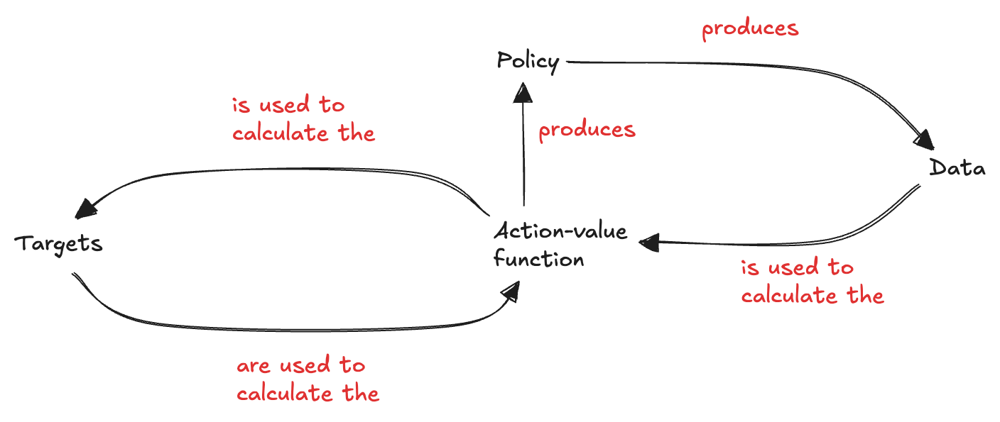

**This circular dependency is bad**. It’s not well behaved because **it doesn’t respect several of the assumptions made in supervised learning problems**. However, we can goes on and see what we can do with it.

We collect a dataset by interacting with the environment and calculate the "true" values using the Q-learning target. However, the dataset requires a couple of assumptions: data must be **independent and identically distributed (IID)** and targets must be **stationary**. We cannot ensure any of these assumptions. The selection of a robust implementation of the gradient descent algorithm is crucial. The **Adam optimizer** is a popular choice, as it adapts the learning rate for each parameter, making it suitable for non-stationary data and noisy environments:

In [711]:
learning_rate = 0.0007;
optimizer = torch.optim.RMSprop(ann.parameters(), lr=learning_rate);

It's important to note that when differentiating the error function, the gradient is computed solely with respect to the predicted values, not the target values. In supervised learning, "predicted values" come from the model, while "true values" are constants provided in advance. In reinforcement learning, however, the "true values" depend on the predicted values themselves, as they are generated by the model. **Although this value is not a true constant, it should be treated as one during the optimization**:

$\displaystyle \nabla_{\theta_i} L(\theta)=E_{s,a} \left[ ( r + \gamma \underset{a}{\text{ max }} Q(s',a;\theta) - Q(s,a;\theta)) \nabla_{\theta} Q(s,a;\theta) \right]$

The problem with this on-line update rule is that if weights are adjusted for one certain state action pair, then unpredictable changes also occur at other places in the state-action space. Although in principle this have the positive effect of generalization, in many cases this seems to be the main reason for unreliable and slow learning.

Fanally, we can optimize the network using the collected experiences, the loss fucntion and the backpropagation algorithm:

In [712]:
def optimize(experiences, gamma, epochs):

    # prepare the experience as tensors
    states = torch.from_numpy(experiences['state'].copy()).float();
    actions = torch.from_numpy(experiences['action'].copy()).long();    
    next_states = torch.from_numpy(experiences['next_state'].copy()).float();
    rewards = torch.from_numpy(experiences['reward'].copy()).float();
    failures = torch.from_numpy(experiences['failure'].copy()).long();

    for epoch in range(epochs):

        # get the values of the Q-function at next state
        # remember to detach, we need to treat these values as constants! 
        Q_next = ann(next_states).detach();
        
        # get the max value 
        max_Q_next = Q_next.max(1)[0];

        # one important step, often overlooked, is to ensure 
        # that failure states are grounded to zero
        max_Q_next *= (1 - failures.float());

        # calculate the target 
        target = rewards + gamma * max_Q_next;

        # finally, we get the current estimate of Q(s,a)
        Q_current = torch.gather(ann(states), 1, actions.unsqueeze(1)).squeeze(1);

        # create the errors
        td_error = target - Q_current;

        # calculate the error
        error = td_error.pow(2).mean();

        # backward pass: compute the gradients
        optimizer.zero_grad();
        error.backward();

        # update model parameters
        optimizer.step();

    return error;

Now we can put things together and consider the full algorith: 

1. Use a neural network with states as input and actions as output
2. Use an epsilon-greedy strategy to explore the environment and to collect some experiences
3. Calculate the Q-Learning targets
4. Fit the action-value function using MSE for the error function and Adam as optimizer
5. Repeats steps 3 and 4 a number of times (epochs) before going back to step 2

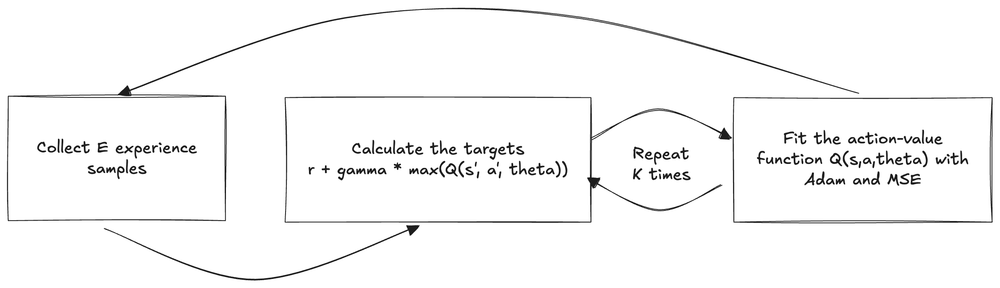

We can write this process and apply it to the Cart-pole environment:

In [713]:
import copy

def nfq(env, experiences, max_episodes, epochs, gamma, epsilon):

    # Create a batch index
    index = 0;

    # Create a score tracker for statistic purposes
    scores = [];

    # Counter for the number of steps 
    step = 0;

    # Save the best score and episode obtained so far
    best_score = -1;
    best_episode = -1;

    # Store the best ann
    best_ann = None;

    # Train until for the maximum number of episodes
    for episode in range(max_episodes):

        # Reset the environment at the beginning of the episode
        state, done = env.reset()[0], False;

        # Interact with the environment until the episode is done
        while not done:
                
            # Select the action using the exploration policy
            action = epsilon_greedy(state, action_size, epsilon);
            
            # Perform the selected action
            next_state, reward, terminal, truncated, _ = env.step(action);

            # Check if the episode is done
            done = terminal or truncated;

            # Check if the episode failed
            failure = terminal and not truncated;

            # Store the experience
            experiences[index] = (state, action, reward, next_state, failure);
            index += 1;
            
            # If the experience collected so far is enough...
            if index == len(experiences):
                
                # Optimize the model
                optimize(experiences, gamma, epochs);
                
                # Clear the buffer
                index = 0;
                experiences = np.empty(shape=(len(experiences),), dtype=experience_type);

            # Update current state to next state
            state = next_state;

            # Update the step counter
            step += 1;

            # Sometime print steps 
            if(step % 10 == 0):
                message = 'Episode {:03}, steps {:04}';
                message = message.format(episode+1, step);
                print(message, end='\r', flush=True);

        # After each episode, evaluate the policy
        score = evaluate_rewards(env, ann_pi, episodes=5);

        # in case the score is the best so far...
        if(score > best_score):
            best_score = score;
            best_episode = episode;
            best_ann = copy.deepcopy(ann)

        # Store the score in the tracker
        scores.append(score);
        
        # print some informative logging 
        message = 'Episode {:03}, steps {:04}, current score {:05.1f}, best score {:05.1f} at episode {:03}';
        message = message.format(episode+1, step, score, best_score, best_episode);
        print(message, end='\r', flush=True);
        
    return scores, best_ann;

We can apply the algorithm to the Cart-pole environment:

In [714]:
# Define hyperparameters values
max_episodes = 1000; 
epochs = 32; 
gamma = 1;
epsilon = 0.5; 

# run the algorithm
nfq_scores, ann = nfq(cartpole, experiences_batch, max_episodes, epochs, gamma, epsilon);

We can evaluate the performance of the learned agent versus the random one:

In [715]:
agent_score = evaluate_rewards(cartpole, ann_pi, episodes=10);
print("Random score", random_score);
print("Agent score", agent_score);

Random score 20.72
Agent score 339.0


And we can see the agent in action:

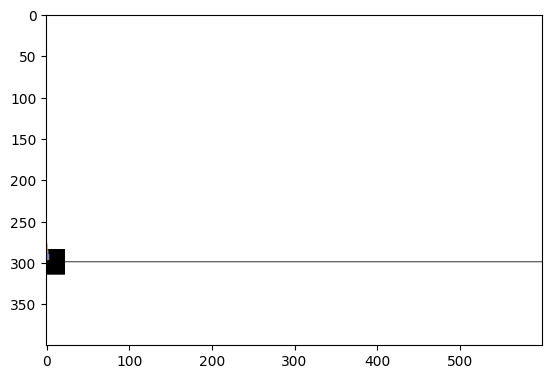

In [716]:
show_episodes(cartpole, ann_pi, n_episodes=1, sleep=0)

The agent is good enough to balance the pole for a considerable amount of time. Howerver, There are two issues with NFQ algorithm. First, we’re using a powerful function approximator, that can generalize across state-action pairs, which is excellent, but that also means that the neural network adjusts the values of all similar states at once. However, notice that **our target values depend on the values for the next state**. In other words, we’re creating a **non-stationary target** for our learning updates. As we update the weights of the approximate Q-function, the targets also move and make our most recent update outdated. Thus, training becomes **unstable** quickly.

### Deep Q-Network (DQN)

Function approximation in reinforcement learning faces two key challenges: **violations of the IID assumption** and **non-stationary targets**. Unlike supervised learning, where data is pre-collected, shuffled, and split to improve generalization and convergence, RL gathers data **online**, as sequential experiences where each sample correlates with the previous one. Moreover, the data distribution is constantly shifting since actions depend on a changing policy. Additionally, while supervised learning relies on fixed training targets, RL targets **evolve with every update**. Each optimization step alters the value function, making previous targets outdated or biased even before they are used:

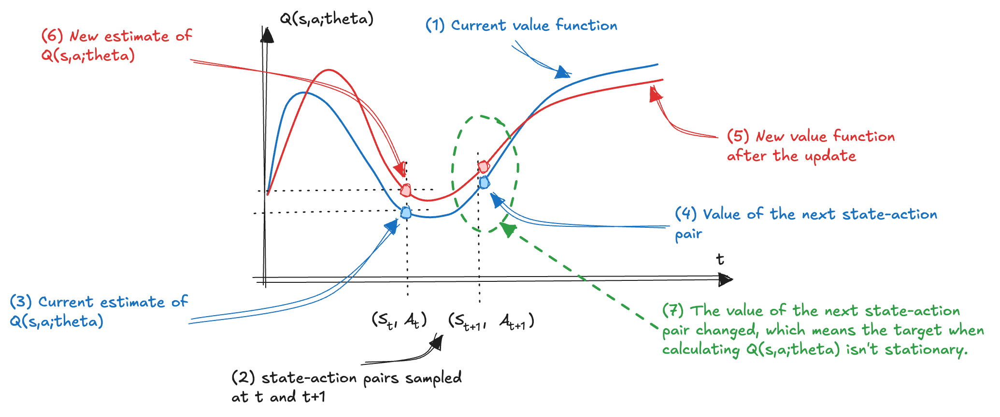

In order to address these issues, we can uses a **replay buffer** to store experience samples, and a **target network** to stabilize the learning process.

In NFQ, training alternates between computing new targets and optimizing the network using a batch of N temporally correlated samples, often from the same trajectory. **Experience replay** mitigates this by storing M >> N past experiences in a **replay buffer**, enabling sampling from a broader distribution. This diversifies batches, reducing overfitting to recent experiences and stabilizing training. By mixing samples from different trajectories and policies, the replay buffer **approximates IID data**, improving optimization stability:

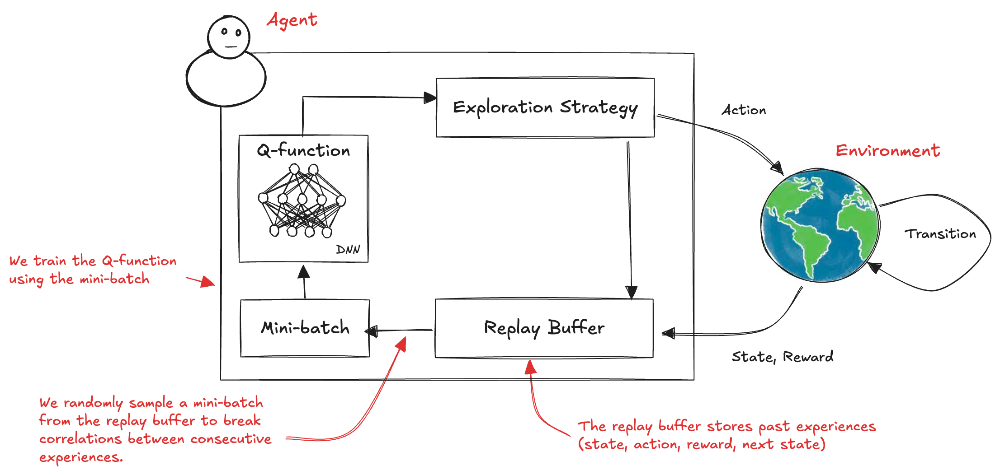

The only difference with NFQ is that **we’re now obtaining the experiences we use for training by sampling uniformly at random the replay buffer**, instead of using the online experiences as before:

$\displaystyle L(\theta) = E_{(s,a) \sim U(D)} \left[ ( r + \gamma \underset{a}{\text{ max }} Q(s',a;\theta) - Q(s,a;\theta))^2 \right]$

Implementing experience replay in high-dimensional environments is challenging due to **memory limitations**, especially in image-based tasks where states are stacks of frames. A naive approach quickly exhausts hardware memory. While a simple implementation aids understanding, a **circular buffer** is more practical, it efficiently manages storage by overwriting the oldest experiences once full, ensuring continuous learning without excessive memory use.

In [717]:
memory_size = 100000; 

replay_memory = {
    'size': memory_size,
    'buffer': np.empty(shape=(memory_size,), dtype=experience_type),
    'index': 0,
    'entries': 0
}

We write a method to store a new experience in the replay buffer:

In [718]:
def store_experience(memory, experience):
    # store the experience in the buffer
    memory['buffer'][memory['index']] = experience;
    
    # update the number of experiences in the buffer
    memory['entries'] = min(memory['entries'] + 1, memory['size']);

    # update index, if the memory is full, start from the begging 
    memory['index'] += 1;
    memory['index'] = memory['index'] % memory['size'];

And a method to sample a batch of experiences from the replay buffer:

In [719]:
def sample_experiences(memory, batch_size):

    # select uniformly at random a batch of experiences from the memory
    idxs = np.random.choice(range(memory['entries']), batch_size, replace=False);  

    # return the batch of experiences
    experiences = memory['buffer'][idxs];

    return experiences;

As we mentioned before, the targets used for training are not stationary:

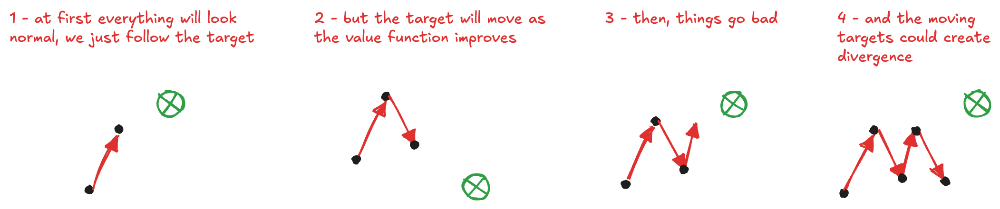

To stabilize target values, a **target network** is used: a separate network that remains fixed for several steps, providing more consistent targets:

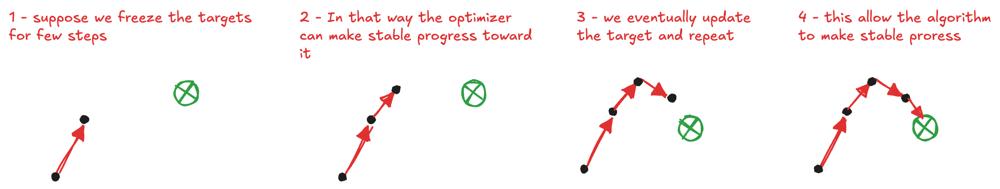

This prevents the network from "chasing its own tail" by creating **small sequential supervised learning tasks**, stabilizing targets for a fixed number of steps. This significantly reduces divergence, with the key difference from NFQ being **the age of the network weights**:

$\displaystyle L(\theta) = E_{(s,a) \sim U(D)} \left[ ( r + \gamma \underset{a}{\text{ max }} Q(s',a;\theta^-) - Q(s,a;\theta))^2 \right]$

In practice, the **target network** is just a **frozen copy** of the main network, updated periodically. We can implement a function to create the neural network:

In [720]:
ann = torch.nn.Sequential(
        torch.nn.Linear(state_size[0], 512),  
        torch.nn.ReLU(),                           
        torch.nn.Linear(512, 128),
        torch.nn.ReLU(),
        torch.nn.Linear(128, action_size));

target_ann = torch.nn.Sequential(
        torch.nn.Linear(state_size[0], 512),  
        torch.nn.ReLU(),                           
        torch.nn.Linear(512, 128),
        torch.nn.ReLU(),
        torch.nn.Linear(128, action_size));

The online network is trained, so we need an optimizer:

In [721]:
optimizer = torch.optim.RMSprop(ann.parameters(), lr=learning_rate);

The target network is not trained, but sometimes we need to **update its weights to match the online network weights**:

In [722]:
def update_target():
    # copy the parameters from the online model to the target model
    for target_params, online_params in zip(target_ann.parameters(), ann.parameters()):
        target_params.data.copy_(online_params.data);

By using the target network, we allow the weights to move consistently toward the targets before an update changes the optimization problem, but we also **slow down learning** because you’re no longer training on up-to-date values. It’s essential to **balance stability and speed** by tuning this hyperparameter. We can modify the optimizing method in order to use the target network to calculate the value of the next state, but the online network to calculate the values of the current state:

In [723]:
def optimize_dqn(memory, batch_size, gamma):

    # sample a batch of experiences
    batch = sample_experiences(memory, batch_size);
    
    # prepare the experience as tensors
    states = torch.from_numpy(batch['state'].copy()).float();
    actions = torch.from_numpy(batch['action'].copy()).long();    
    next_states = torch.from_numpy(batch['next_state'].copy());
    rewards = torch.from_numpy(batch['reward'].copy()).float();
    failures = torch.from_numpy(batch['failure'].copy()).long();

    # get the values of the Q-function at next state from the "target" network 
    # remember to detach, we need to treat these values as constants 
    Q_target_next = target_ann(next_states).detach();
    
    # get the max value 
    max_Q_target_next = Q_target_next.max(1)[0];

    # one important step, often overlooked, is to ensure 
    # that failure states are grounded to zero
    max_Q_target_next *= (1 - failures.float())

    # calculate the target 
    target = rewards + gamma * max_Q_target_next;

    # finally, we get the current estimate of Q(s,a)
    # here we query the current "online" network
    Q_online_current = torch.gather(ann(states), 1, actions.unsqueeze(1)).squeeze(1);

    # create the errors
    td_error = target - Q_online_current;

    # calculate the loss
    loss = td_error.pow(2).mean();

    # backward pass: compute the gradients
    optimizer.zero_grad();
    loss.backward();

    # update model parameters
    optimizer.step();

[**Deep Q-network (DQN)**](./papers/(2013)%20-%20Playing%20Atari%20with%20Deep%20Reinforcement%20Learning.pdf) is one of the most popular deep RL algorithms and it started a series of research innovations that mark the history of RL. DQN claimed for the first time **superhuman level performance** on the [**Atari benchmark**](./papers/(2015)%20-%20Human-level%20control%20through%20deep%20reinforcement%20learning.pdf) in which agents learned from raw pixel data from mere images. We now implement the full DQN algorithm, the main difference with NFQ are that is uses the replay buffer and the target network. The algorithm is as follows:

1. Collect experience and insert it into the replay buffer
2. Randomly sample a batch from the buffer and provide it in input to both the online and the target network
3. Use the target network to calculate the Q-values of the next state, but use the online network to calculate the Q-values of the current state
4. Compute the error function and update the online network
5. Sometimes update the target network with the online network weights.

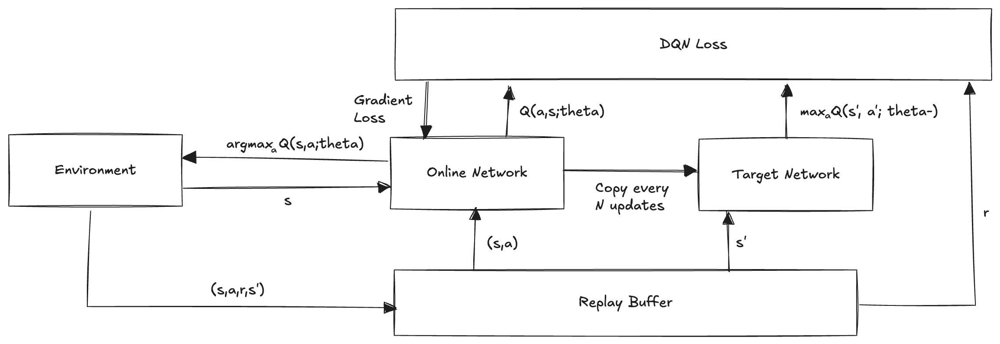

In [724]:
def dqn(env, memory, memory_start_size, batch_size, target_update_steps, epsilon, gamma, max_episodes):
    
    # Create a score tracker for statistic purposes
    scores = [];
    
    # Counter for the number of steps 
    step = 0;

    # Save the best score and episode obtained so far
    best_score = -1;
    best_episode = -1;

    # Store the best ann
    best_ann = None;

    # Update the target model with the online one
    update_target();
                   
    # Train until for the maximum number of episodes
    for episode in range(max_episodes):
        
        # Reset the environment before starting the episode
        state, done = env.reset()[0], False;

        # Interact with the environment until the episode is done
        while not done:
                    
            # Select the action using the exploration policy
            action = epsilon_greedy(state, action_size, epsilon);

            # Perform the selected action
            next_state, reward, terminal, truncated, _ = env.step(action);

            # Check if the episode is done
            done = terminal or truncated;

            # Check if the episode failed
            failure = terminal and not truncated;

            # Store the experience into the replay buffer
            experience = (state, action, reward, next_state, failure);
            store_experience(memory, experience);
    
            # If the replay buffer is large enough...
            if memory['entries'] > memory_start_size:

                # Optimize the online model
                optimize_dqn(memory, batch_size, gamma);
                 
                # Sometimes, synchronize the target model with the online model
                if step % target_update_steps == 0:
                    update_target();
                
            # Update current state to next state
            state = next_state;

            # update the step counter
            step += 1;

            # sometime print steps 
            if(step % 10 == 0):
                message = 'Episode {:03}, steps {:04}';
                message = message.format(episode+1, step);
                print(message, end='\r', flush=True);
        
        # After each episode, evaluate the policy
        score = evaluate_rewards(env, ann_pi, episodes=5);

        # in case the score is the best so far...
        if(score > best_score):
            best_score = score;
            best_episode = episode;
            best_ann = copy.deepcopy(ann)

        # Store the score in the tracker
        scores.append(score);

        # print some informative logging 
        message = 'Episode {:03}, steps {:04}, current score {:05.1f}, best score {:05.1f} at episode {:03}';
        message = message.format(episode+1, step, score, best_score, best_episode);
        print(message, end='\r', flush=True);
        
    return scores, best_ann;

We can apply the algorithm to the CartPole environment, where tuning the hyperparameters is critical to optimizing the agent’s performance.

In [725]:
# Det the hyperparameters
max_episodes = 1000;
gamma = 1;
epsilon = 0.5;
memory_start_size = 1000;
batch_size = 32; 
target_update_steps = 250;

dqn_scores, ann = dqn(cartpole, replay_memory, memory_start_size, batch_size, target_update_steps, epsilon, gamma, max_episodes);

To compare the performance of the DQN algorithm with that of the NFQ algorithm, we can plot the average reward obtained by the agent over time during training:

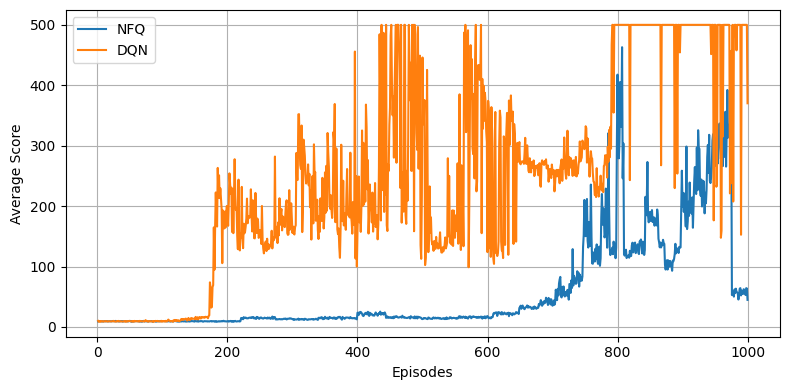

In [726]:
# Crate the list of episodes
episodes = np.arange(1, len(nfq_scores) + 1)

plt.figure(figsize=(8, 4))  

plt.plot(episodes, nfq_scores, label="NFQ")
plt.plot(episodes, dqn_scores, label="DQN")

plt.xlabel("Episodes")
plt.ylabel("Average Score")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

While NFQ's performance fluctuates significantly, DQN demonstrates more consistent results and faster convergence, making it more suitable for this type of environment. It reach high score in a hundred of episodes, while NFQ requires much more episodes to achieve similar results. DQN is more efficient algorithm, and it is the foundation for many other deep RL algorithms. In any way, all those methods are really **sensitive to hyperparameters** (change any hyperparameter and you  will find more values that doesn’t work than values that do), **assume to interact with a Markovian environment** (state contains all information required by the agent), and **the combination of bootstrapping, off-policy learning, and function approximator** is known as [**the deadly triad**](./papers/(2018)%20-%20Deep%20Reinforcement%20Learning%20and%20the%20Deadly%20Triad.pdf).